<a href="https://colab.research.google.com/github/toshikis/AISeminar/blob/%E5%BE%A9%E7%BF%92%E7%94%A8%E6%95%99%E6%9D%90/%E6%A9%9F%E6%A2%B0%E5%AD%A6%E7%BF%92%E5%BF%9C%E7%94%A8%E2%91%A2IT%E4%BC%81%E6%A5%AD%E3%81%AE%E9%80%80%E8%81%B7%E8%80%85%E4%BA%88%E6%B8%AC_%E8%AC%9B%E5%B8%AB%E7%94%A8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <font color=#0e89b2>0. ライブラリのインストール</font>

このパートで必要になるライブラリを一括してインポートしておきましょう。<br>

In [ ]:
#データ分析/データ可視化ライブラリ
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns

#機械学習ライブラリ　LightGBM
import lightgbm as lgb

#機械学習ライブラリ　sklearn ユーティリティ
from sklearn.model_selection import train_test_split,StratifiedKFold,cross_validate
from sklearn.metrics import accuracy_score,precision_score,recall_score,confusion_matrix,roc_curve,roc_auc_score,log_loss
from sklearn.preprocessing import StandardScaler,LabelEncoder

#不均衡データの少数派データを増やすオーバサンプリング手法 SMOTE
from imblearn.over_sampling import SMOTE

#データフレームが全列表示されるように設定
pd.set_option('display.max_columns', None)

# <font color=#0e89b2>1. 退職リスク予測</font>

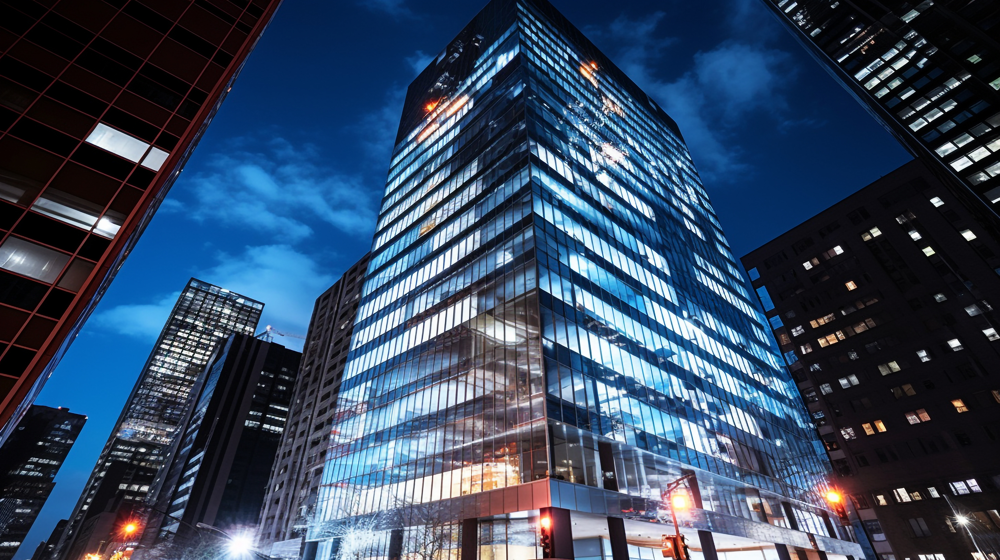

この単元では、月収や学歴などの人事情報から、社員の退職リスクを予測するモデルを作成していきます。<br>
人事情報から、退職する/退職しないを予測するので、2値分類タスクになります。<br>
<br>
使用するデータセットは、世界的なデータコンペティションサイトKaggle上で公開されているものです。<br>
IBM HR Analytics Employee Attrition & Performance<br>
https://www.kaggle.com/datasets/pavansubhasht/ibm-hr-analytics-attrition-dataset<br>
<br>
以下のリンクからデータをダウンロードしましょう。<br>
https://drive.google.com/file/d/1Hf7Uy8OrrKrgSo4qP7BMeHDxWCmKE2Kt/view?usp=drive_link


# <font color=#0e89b2>2. 演習</font>

社員が退職するかどうか（`Attrition`）を予測するモデルを自由に構築してください。<br>
なるべく高い精度を目指しましょう。<br>
なお、データの内容は下記の通りです。

| カラム名 | 内容 | 備考 |
|    ---   |    ---     |  ---  |
| Age |年齢 |  |
|Attrition|離職の有無||
|BusinessTravel|出張の頻度||
|DailyRate|日給レート||
|Department|所属部署||
|DistanceFromHome|自宅ー職場間の距離|単位はマイル|
|Education|学歴||
|EducationField|学生時代の専門分野||
|EmployeeCount|グループを構成する従業員の数||
|EmployeeNumber|従業員番号（各従業員に割り振られている？）||
|EnvironmentSatisfaction|環境への満足度|4段階の従業員アンケート結果|
|Gender|性別||
|HourlyRate|時給レート||
|JobInvolvement|仕事への関与のレベル|4段階の従業員アンケート結果|
|JobLevel|仕事のレベル|5段階の従業員アンケート結果|
|JobRole|仕事上の役割（職種、役職）||
|JobSatisfaction|仕事への満足度|4段階の従業員アンケート結果|
|MaritalStatus|婚姻の状況||
|MonthlyIncome|月収||
|MonthlyRate|月収レート||
|NumCompaniesWorked|これまでに勤務した企業数||
|Over18|18歳以上か？||
|OverTime|残業の有無||
|PercentSalaryHike|昇給率||
|PerformanceRating|パフォーマンスレート|4段階の従業員アンケート結果|
|RelationshipSatisfaction|人間関係への満足度|4段階の従業員アンケート結果|
|StandardHours|標準労働時間||
|StockOptionLevel|ストックオプションレベル||
|TotalWorkingYears|トータルの勤続年数||
|TrainingTimesLastYear|過去1年間のトレーニング受講時間||
|WorkLifeBalance|ワークライフバランス|4段階の従業員アンケート結果|
|YearsAtCompany|この会社での勤続年数||
|YearsInCurrentRole|現在の役職についてからの年数||
|YearsSinceLastPromotion|最後の昇進からの年数||
|YearsWithCurrManager|現在のマネージャーになってからの年数||

# <font color=#0e89b2>3. 解答例</font>

## <font color=#0e89b2>3.1 データ読み込み</font>

いつものように、データを読み込みます。

In [ ]:
#pandas(pd)のread_csvメソッドでデータを読み込み
df = pd.read_csv("sample_data/hr.csv")

#変換前の生データを変数df_initとして保存しておきます。
df_init = df.copy()

## <font color=#0e89b2>3.2 データの確認</font>

### <font color=#0e89b2>(1) データ確認①：データ表示</font>

上で見たように、人事に関する35項目のデータが並んでいます。<br>
今回の目的変数は"Attrition"になります。<br>
データはすでにある程度整形してあるイメージを受けます。

In [ ]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


### <font color=#0e89b2>(2) データ確認②：データサイズ</font>

データのサイズを確認してみます。<br>
pandas(pd)のshapeメソッドで、dfという変数に代入された表形式のデータのサイズを求めることができます。<br>
結果は　(1470, 35)　と表示され、データ数が1470個であることがわかります。<br>
35は先ほどあったように、１データ当たりの項目(カラム)数です。

In [ ]:
df.shape

(1470, 35)

### <font color=#0e89b2>(3) データ確認③：カラム名確認</font>

各項目(各カラム)の名前をすべて表示させてみます。<br>
pandas(pd)のcolumnsメソッドで、dfという変数に代入された表形式のデータの各項目(各カラム)の名前を求めます。



In [ ]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

### <font color=#0e89b2>(4) データ確認④：欠損値とデータタイプ</font>

各カラムに欠損値の有無とデータタイブを調べてみます。<br>
<br>
表示結果を見てみます。<br>
すべてのカラムについてNon-Null Countは1470 non-nullと表示されており、<br>
欠損値はないことがわかります。<br>
<br>
またDtypeはint64型(64bit整数の数値データ)とobject型(カテゴリデータ)の２種類があり、<br>
各カラムが数値データか、カテゴリデータであることを示しています。





In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

また、他に欠損値(null値)を確認する方法として<br>
pandas(pd)のisnullメソッドにsumメソッドを連結させて求めることができます。

In [ ]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

### <font color=#0e89b2>(5) データ確認⑤：要約統計量</font>

数値データの要約統計量を求めてみます。(カテゴリデータは求めることができません)<br>
pandas(pd)のdescribeメソッドで求めることができます。<br>
求められる統計量は以下です。<br>


*   count(欠損値でない個数)
*   mean(平均値調べて
*   std(標準偏差)
*   min(最小値)
*   25%(1/4分位数)
*   50%(中央値)
*   75%(3/4分位数)
*   max(最大値)

In [ ]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


正直これを見てもあまり示唆は得られませんでした。

### <font color=#0e89b2>(6) データ確認⑥：相関係数確認</font>

数値データ同士の相関係数図を求めてみます。<br>
相関係数を一言でいうと、「2種類のデータ間の関連性（相関関係）の強さを示す指標」です。<br>

*   相関係数が1に近い：正の相関
*   相関係数が‐1に近い：負の相関
*   相関係数が0に近い：相関がない<br>
自分自身との相関係数は1になります。(例 Age-Ageの相関係数は1)






pandas(pd)のcorrメソッドで相関係数を求めることができます。<br>
可視化ツールのseaborn(sns)でヒートマップとして可視化します。

<ipython-input-78-ba53fe4ad51f>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor_mat= df.corr()


<Axes: >

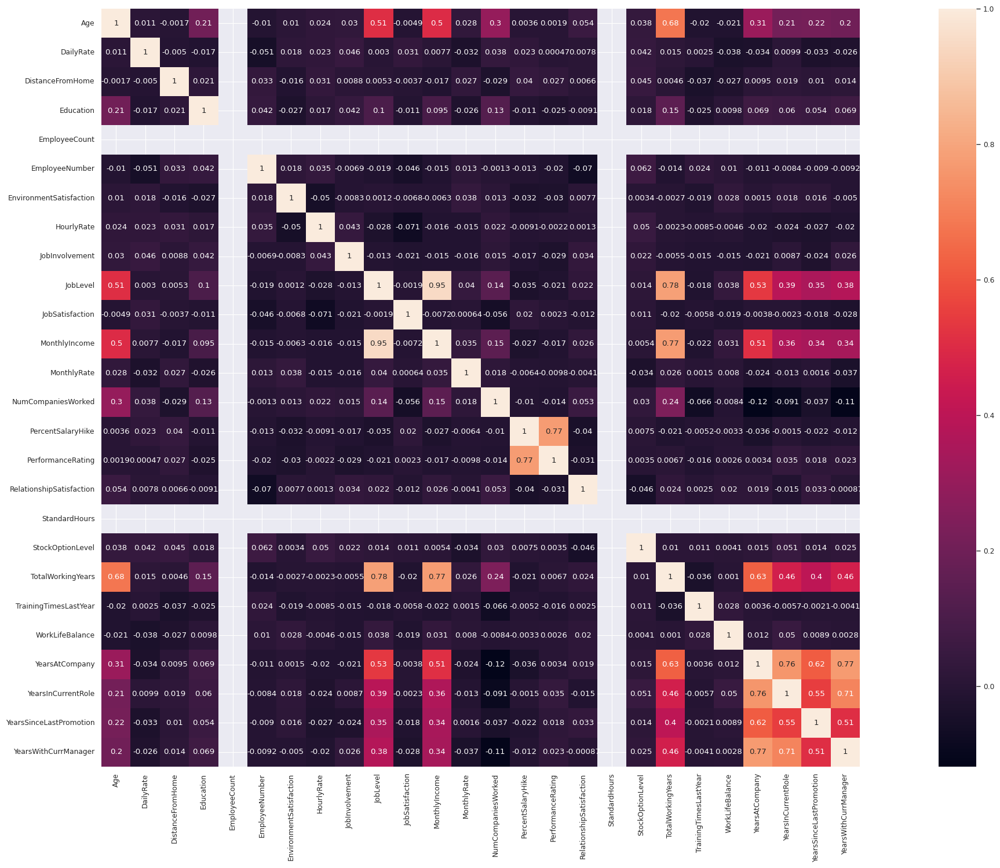

In [ ]:
#pandas(pd)のcorrメソッドで相関係数を求める
cor_mat= df.corr()

#グラフ設定
fig=plt.gcf()
fig.set_size_inches(35,17)

#seaborn可視化設定
sns.set(font_scale=0.1)
sns.set_context('paper')
sns.heatmap(data=cor_mat,square=True,annot=True,cbar=True)

Age、TotalWorkingYears、JobLevel, MonthlyIncome、YearsAtCompanyあたりの相関が互いに高いことが分かりますが、<br>
まあそれはそうだろうなという感じですね。<br>
一般的な年功序列の企業なのでしょう。<br>
<br>
ちなみに今回は目的変数がカテゴリデータの2値分類問題ですが、<br>
目的変数が数値データの場合は、目的変数との相関係数が低い説明変数は削除するとモデル精度が向上することがあります。

### <font color=#0e89b2>(7) データ確認⑦：退職者と非退職者の割合</font>

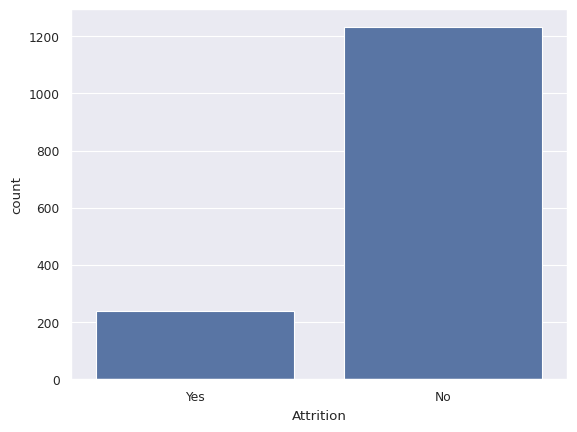

In [ ]:
#離職フラグのYes/No別の数で棒グラフを作成
sns.countplot(x="Attrition", data=df_init)
plt.show()

非退職者のデータ数に対して、退職者のデータ数が少ないことが分かります。<br>
モデルの評価を行う場合に注意が必要そうです。<br>
詳しくは後ほど見てみましょう。

## <font color=#0e89b2>3.3 データ前処理</font>

### <font color=#0e89b2>(1) データ前処理①：ラベルエンコーディング</font>

例によって機械学習モデルは、通常は数値データしか入力できないので、<br>
カテゴリデータを数値データに変換していきます。<br>
<br>
今回は、ラベルエンコーディングを行なっていきます。<br>
<br>
ここではsklearnのユーティリティのLabelEncoderを使用します。<br>
LabelEncoderによって、カテゴリデータがラベルに変換されます。<br>
<br>
例えば、カテゴリデータのAttrition:離職フラグであれば、<br>
元々のデータはYes/Noの形式でしたが<br>
ラベルエンコーディングを行うと、Yesが1に、Noが0に変換されます。（0,1は逆になることもあります。）<br>
<br>
それではラベルエンコーディングを実行する関数Label_Encoder()を定義してみます。




In [ ]:
#関数定義　引数はfeature[項目名]を定義
def Label_Encoder(feature):

    #LabelEncoderを定義
    le=LabelEncoder()

    #今回のデータdfの入力したfeature[項目名]をOhneHotエンコーディング実行
    df[feature]=le.fit_transform(df[feature])

次にカテゴリデータの項目名のリストを作成します。<br>
pandas(pd)のselect_dtypeメソッドでobject型(カテゴリデータ)の項目のみのデータを作成して<br>
columnsメソッドでその項目名のリストを表示させています。<br>

In [ ]:
#object型(カテゴリデータ)の項目データのみを変数cat_dfに代入
cat_df=df.select_dtypes(include='object')

#object型(カテゴリデータ)のみの項目名のリストを求めて表示
cat_df.columns

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus', 'Over18', 'OverTime'],
      dtype='object')

先ほど表示したobject型(=カテゴリデータ)のみの項目名のリストcat_df.columnsから<br>
for文で各項目名を呼び出し、関数Label_Encoder()へ入力して変換します。<br>

In [ ]:
#for文で各項目名を1つずつ呼び出し
for col in cat_df.columns:
    #関数OneHot_Encoder()へ入力して変換
    Label_Encoder(col)

比較のために変換前のデータを表示します。

In [ ]:
df_init.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


次に変換後のデータを見てみましょう。<br>
例えばカテゴリデータのAttrition:離職フラグは、<br>
Yes/No→1/0に変換されています。

In [ ]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,1,1,2,0,94,3,2,7,4,2,5993,19479,8,0,1,11,3,1,80,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,1,2,3,1,61,2,2,6,2,1,5130,24907,1,0,0,23,4,4,80,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,1,4,4,1,92,2,1,2,3,2,2090,2396,6,0,1,15,3,2,80,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,1,5,4,0,56,3,1,6,3,1,2909,23159,1,0,1,11,3,3,80,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,1,7,1,1,40,3,1,2,2,1,3468,16632,9,0,0,12,3,4,80,1,6,3,3,2,2,2,2


### <font color=#0e89b2>(2) データ前処理②：目的変数と説明変数を分割</font>

Attrition:離職フラグを目的変数(Y)、その他を説明変数(X)とします。

In [ ]:
X = df.drop('Attrition',axis=1)
Y = df['Attrition']

### <font color=#0e89b2>(3) データ前処理③：数値データの標準化</font>

これも復習になりますが、<br>
標準化(Standardization)とは、数値データを平均0、分散1に変換(スケーリング)することを言います。<br>
<br>
なぜこの標準化が必要かと言うと<br>
例えば今回のデータでは

*   DailyRate  平均 802.485714
*   HourlyRate 平均 65.891156 	<br>

とありますが、機械学習モデルは数値の大きいDailyRateを重要視してしまうからでしたね。<br>
(ただしランダムフォレストなど、数値の大小ではなく閾値によって判別する系のアルゴリズムでは、<br>
標準化してもしていなくてもそれほど変わらなかったりはします）<br>
<br>
今回もsklearnのStandardScaler()を使用して標準化します。

In [ ]:
#比較のため標準化前の説明変数(X)をDataFrameとして保存しておきます。
X_before = pd.DataFrame(X)

#比較のため標準化前の説明変数(X)の項目名を保存しておきます。
X_before_col = X_before.columns

#sklearnのStandardScaler()を定義します。
scaler = StandardScaler()

#StandardScaler()で標準化を行います。
X_Standard = scaler.fit_transform(X)

比較のために標準化前の説明変数(X)を表示させてましょう。

In [ ]:
X_before.head()

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,2,1102,2,1,2,1,1,1,2,0,94,3,2,7,4,2,5993,19479,8,0,1,11,3,1,80,0,8,0,1,6,4,0,5
1,49,1,279,1,8,1,1,1,2,3,1,61,2,2,6,2,1,5130,24907,1,0,0,23,4,4,80,1,10,3,3,10,7,1,7
2,37,2,1373,1,2,2,4,1,4,4,1,92,2,1,2,3,2,2090,2396,6,0,1,15,3,2,80,0,7,3,3,0,0,0,0
3,33,1,1392,1,3,4,1,1,5,4,0,56,3,1,6,3,1,2909,23159,1,0,1,11,3,3,80,0,8,3,3,8,7,3,0
4,27,2,591,1,2,1,3,1,7,1,1,40,3,1,2,2,1,3468,16632,9,0,0,12,3,4,80,1,6,3,3,2,2,2,2


標準化後の説明変数(X)を表示させてましょう。<br>
このように数値データが平均0、分散1に変換(スケーリング)されいます。

In [ ]:
#標準化後の説明変数(X)をDataFrameに変換、そのときの項目名は変換前のものをつける
X_after = pd.DataFrame(X_Standard, columns=X_before_col)
X_after.head()

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.446350,0.590048,0.742527,1.401512,-1.010909,-0.891688,-0.937414,0.0,-1.701283,-0.660531,-1.224745,1.383138,0.379672,-0.057788,1.032716,1.153254,1.236820,-0.108350,0.726020,2.125136,0.0,1.591746,-1.150554,-0.426230,-1.584178,0.0,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834
1,1.322365,-0.913194,-1.297775,-0.493817,-0.147150,-1.868426,-0.937414,0.0,-1.699621,0.254625,0.816497,-0.240677,-1.026167,-0.057788,0.626374,-0.660853,-0.133282,-0.291719,1.488876,-0.678049,0.0,-0.628241,2.129306,2.346151,1.191438,0.0,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541
2,0.008343,0.590048,1.414363,-0.493817,-0.887515,-0.891688,1.316673,0.0,-1.696298,1.169781,0.816497,1.284725,-1.026167,-0.961486,-0.998992,0.246200,1.236820,-0.937654,-1.674841,1.324226,0.0,1.591746,-0.057267,-0.426230,-0.658973,0.0,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935
3,-0.429664,-0.913194,1.461466,-0.493817,-0.764121,1.061787,-0.937414,0.0,-1.694636,1.169781,-1.224745,-0.486709,0.379672,-0.961486,0.626374,0.246200,-0.133282,-0.763634,1.243211,-0.678049,0.0,1.591746,-1.150554,-0.426230,0.266233,0.0,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935
4,-1.086676,0.590048,-0.524295,-0.493817,-0.887515,-1.868426,0.565311,0.0,-1.691313,-1.575686,0.816497,-1.274014,0.379672,-0.961486,-0.998992,-0.660853,-0.133282,-0.644858,0.325900,2.525591,0.0,-0.628241,-0.877232,-0.426230,1.191438,0.0,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227


### <font color=#0e89b2>(4) データ前処理④：trainデータとtestデータに分割</font>

sklearnのtrain_test_splitを用いて、<br>
説明変数(X)と目的変数(Y)を訓練(train)データと評価(test)データにランダムに分割します。<br>
比率はtest_size=0.3に設定すると、以下になります。<br>


> 訓練(train)データ:評価(test)データ = 70 : 30<br>

In [ ]:
#trainデータとtestデータに分割
x_train,x_test,y_train,y_test=train_test_split(X_Standard, Y, test_size=0.3 ,shuffle=True, random_state=0)

## <font color=#0e89b2>3.4 モデル作成/評価</font>

モデルの学習と評価を行っていきます。<br>
今回はLightGBMでモデルを実装していきます。<br>
<br>
さらに今回は、ハイパーパラメータの自動最適化フレームワーク"Optuna"を紹介します。<br>
<br>


---
◆Optunaとは
* PrefferdNetworks社（日本）が開発した、ハイパーパラメータの自動最適化フレームワーク
* ベイズ最適化によって、パラメータの探索を効率的に行うことが可能

---



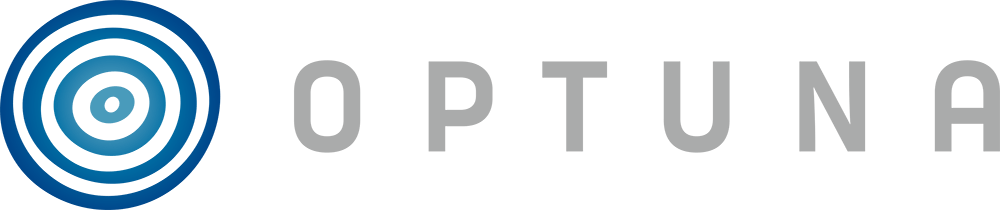

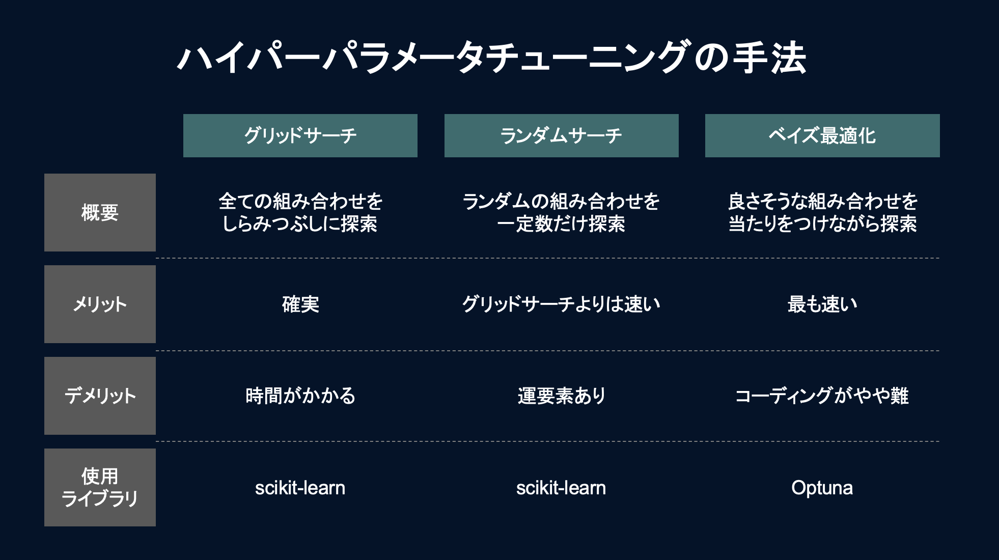

ここで、ハイパーパラメータチューニングの手法をまとめて比較しておきます。<br>
ランダムサーチはこの講座では初出ですが、ランダムの組み合わせを一定数だけ探索する手法です。<br>
<br>
グリッドサーチではしらみつぶしに最適なハイパーパラメータの組み合わせを調べていたので、<br>
組み合わせ数が多くなるととんでもなく時間がかかっていましたが、<br>
ランダムサーチを使うと、探索時間を短縮することができます。<br>
<br>
Optuna（ベイズ最適化）を用いると、良さそうな組み合わせに当てをつけながら探すので、<br>
さらに探索時間が短縮できるイメージです。<br>
<br>
では早速Optunaをインストールして実装してみましょう。

In [ ]:
#optunaをインストール
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.4/413.4 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 8.8 MB/s eta 0:00:00


### <font color=#0e89b2>(1) モデル作成評価①：OptunaによるLightGBMのハイパーパラメータの自動最適化</font>

LightGBMのハイパーパラメータは、全部で100以上存在します。<br>
今回はその中からよくチューニングに用いられるパラメータを選択して自動最適化を行います。<br>



| パラメータ名 | 意味 | 備考 |
|    ---   |    ---     |  ---  |
|①num_leaves|1つの決定木あたりの分岐の数|デフォルト値は31。大きくすると精度は上がるが過学習が進む|
|②max_depth|木構造の深さの最大値|デフォルト値は-1。データが少ないときに過学習を防ぐために設定|
|③min_data_in_leaf|デフォルト値は20。一つの葉に入る最小データ数|大きくすることでデータと分岐が1対1対応することを防ぎ,結果として過学習を抑制|
|④max_bin|一つの分岐に入るデータ数の最大値|小さくすると精度は上がるが過学習が進む|
|⑤learning_rate |学習率|デフォルト値は0.1。大きなnum_iterationsを取るときは小さなlearning_rateを取ると精度が上がる|
|⑥feature_fraction|特徴量を何％使うか|学習速度向上に使える|
|⑦bagging_fraction|バギングの際、訓練用データの何％を使うか|学習速度向上に使える|
|⑧bagging_freq|何回に一回baggingするか|大きくすると精度は上がるが過学習が進む|
|⑨min_child_samples|1枚の葉に含まれる最小データ数|デフォルト値は20|
|⑩num_iterations|学習回数|デフォルト値は100|

In [ ]:
import optuna

#ハイパーパラメータの自動最適化のための関数
def objective(trial):
    #今回、調整する10種類のハイパーパラメータとその探索範囲
    params = {
        'objective': 'binary',
        'num_leaves': trial.suggest_int('num_leaves', 5, 100),
        'max_depth': trial.suggest_int("max_depth", 3, 30),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 20, 50),
        'max_bin': trial.suggest_int('max_bin', 100, 400),
        'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.4, 1.0),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.4, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 7),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'num_iterations': trial.suggest_int('num_iterations', 80, 120)
    }

    #訓練(train)データ設定
    lgb_train = lgb.Dataset(x_train, y_train)

    #評価(test)データ設定
    lgb_eval = lgb.Dataset(x_test, y_test, reference=lgb_train)

    #LightGBM学習設定
    model = lgb.train(params, lgb_train,
                      valid_sets=[lgb_train, lgb_eval],
                      callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=1),
                               lgb.log_evaluation(10),],
                      num_boost_round=500)

    #評価(test)データの推論
    y_pred_valid = model.predict(x_test, num_iteration=model.best_iteration)

    #スコアとして評価(test)データの正解と推論の差のlog_lossを求める
    score = log_loss(y_test, y_pred_valid)
    return score

In [ ]:
#Optunaによるハイパーパラメータの自動最適化実行
study = optuna.create_study(sampler=optuna.samplers.RandomSampler(seed=0))
study.optimize(objective, n_trials=50)
print("Optuna Best Parameters")
print(study.best_params)

[I 2024-01-30 18:39:53,503] A new study created in memory with name: no-name-95c96c4f-09a2-4011-84f9-bdcd18e5fda7
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=38, min_child_samples=97 will be ignored. Current value: min_data_in_leaf=38
[LightGBM] [Warning] min_data_in_leaf is set=38, min_child_samples=97 will be ignored. Current value: min_data_in_leaf=38
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1440
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=38, min_child_samples=97 will be ignored. Current value: min_data_in_leaf=38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM

[I 2024-01-30 18:39:53,996] Trial 0 finished with value: 0.4374947031043623 and parameters: {'num_leaves': 57, 'max_depth': 23, 'min_data_in_leaf': 38, 'max_bin': 264, 'learning_rate': 9.238119916812972e-06, 'feature_fraction': 0.7875364678399936, 'bagging_fraction': 0.6625523267576154, 'bagging_freq': 7, 'min_child_samples': 97, 'num_iterations': 95}. Best is trial 0 with value: 0.4374947031043623.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.443311	valid_1's binary_logloss: 0.437513
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[I 2024-01-30 18:39:54,478] Trial 1 finished with value: 0.4376047990170289 and parameters: {'num_leaves': 81, 'max_depth': 17, 'min_data_in_leaf': 37, 'max_bin': 378, 'learning_rate': 3.142334455004115e-08, 'feature_fraction': 0.4522775798209244, 'bagging_fraction': 0.41213103846419546, 'bagging_freq': 6, 'min_child_samples': 79, 'num_iterations': 115}. Best is trial 0 with value: 0.4374947031043623.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:39:54,784] Trial 2 finished with value: 0.43760434793067476 and parameters: {'num_leaves': 98, 'max_depth': 25, 'min_data_in_leaf': 34, 'max_bin': 334, 'learning_rate': 6.728542208135227e-08, 'feature_fraction': 0.7839526127965143, 'bagging_fraction': 0.4860119724454279, 'bagging_freq': 7, 'min_child_samples': 55, 'num_iterations': 97}. Best is trial 0 with value: 0.4374947031043623.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=95 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.115387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1468
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=95 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[I 2024-01-30 18:39:55,731] Trial 3 finished with value: 0.4376049548990132 and parameters: {'num_leaves': 30, 'max_depth': 24, 'min_data_in_leaf': 34, 'max_bin': 271, 'learning_rate': 1.353719244993874e-08, 'feature_fraction': 0.7705812982455262, 'bagging_fraction': 0.7672574336334528, 'bagging_freq': 5, 'min_child_samples': 95, 'num_iterations': 107}. Best is trial 0 with value: 0.4374947031043623.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:39:55,859] Trial 4 finished with value: 0.4

[LightGBM] [Warning] min_data_in_leaf is set=41, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=41
[LightGBM] [Warning] min_data_in_leaf is set=41, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=41
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 856
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=41, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=41
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM]

[I 2024-01-30 18:39:56,022] Trial 5 finished with value: 0.4376023119934991 and parameters: {'num_leaves': 59, 'max_depth': 15, 'min_data_in_leaf': 50, 'max_bin': 130, 'learning_rate': 2.8982596640452936e-07, 'feature_fraction': 0.49678571073099775, 'bagging_fraction': 0.7918649952792391, 'bagging_freq': 2, 'min_child_samples': 49, 'num_iterations': 90}. Best is trial 4 with value: 0.43281772806397667.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	training's binary_logloss: 0.443452	valid_1's binary_logloss: 0.437604
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[I 2024-01-30 18:39:56,163] Trial 6 finished with value: 0.4376026282822006 and parameters: {'num_leaves': 20, 'max_depth': 6, 'min_data_in_leaf': 40, 'max_bin': 141, 'learning_rate': 2.3772591724440764e-07, 'feature_fraction': 0.6212351023965785, 'bagging_fraction': 0.8925959379087611, 'bagging_freq': 1, 'min_child_samples': 85, 'num_iterations': 83}. Best is trial 4 with value: 0.43281772806397667.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:39:56,297] Trial 7 finished with value: 0.4

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1511
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Traini

[I 2024-01-30 18:39:56,512] Trial 8 finished with value: 0.4361928972665577 and parameters: {'num_leaves': 35, 'max_depth': 14, 'min_data_in_leaf': 21, 'max_bin': 308, 'learning_rate': 9.251457955283514e-05, 'feature_fraction': 0.5592336945636672, 'bagging_fraction': 0.7139488320800198, 'bagging_freq': 1, 'min_child_samples': 60, 'num_iterations': 118}. Best is trial 7 with value: 0.4274359057041387.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	training's binary_logloss: 0.442589	valid_1's binary_logloss: 0.437086
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:39:56,679] Trial 9 finished with value: 0.437594129606484 and parameters: {'num_leaves': 35, 'max_depth': 21, 'min_data_in_leaf': 24, 'max_bin': 315, 'learning_rate': 1.0613109636245955e-06, 'feature_fraction': 0.5099148172042701, 'bagging_fraction': 0.7519077608860498, 'bagging_freq': 1, 'min_child_samples': 84, 'num_iterations': 80}. Best is trial 7 with value: 0.4274359057041387.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_l


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	training's binary_logloss: 0.443446	valid_1's binary_logloss: 0.437601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[I 2024-01-30 18:39:56,888] Trial 10 finished with value: 0.43759691942081147 and parameters: {'num_leaves': 70, 'max_depth': 10, 'min_data_in_leaf': 42, 'max_bin': 389, 'learning_rate': 5.511527829375209e-07, 'feature_fraction': 0.7456944006507021, 'bagging_fraction': 0.7552251587631034, 'bagging_freq': 5, 'min_child_samples': 26, 'num_iterations': 119}. Best is trial 7 with value: 0.4274359057041387.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	training's binary_logloss: 0.443447	valid_1's binary_logloss: 0.437601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	training's binary_logloss: 0.443446	valid_1's binary_logloss: 0.4376
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:39:57,125] Trial 11 finished with value: 0.39316589772219435 and parameters: {'num_leaves': 47, 'max_depth': 26, 'min_data_in_leaf': 41, 'max_bin': 189, 'learning_rate': 0.004972613880453016, 'feature_fraction': 0.6379034445081908, 'bagging_fraction': 0.928661918266697, 'bagging_freq': 5, 'min_child_samples': 89, 'num_iterations': 108}. Best is trial 11 with value: 0.39316589772219435.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	training's binary_logloss: 0.407733	valid_1's binary_logloss: 0.415285
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	training's binary_logloss: 0.443432	valid_1's binary_logloss: 0.437588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[I 2024-01-30 18:39:57,526] Trial 12 finished with value: 0.43753072484060257 and parameters: {'num_leaves': 74, 'max_depth': 17, 'min_data_in_leaf': 49, 'max_bin': 293, 'learning_rate': 9.267985377369853e-06, 'feature_fraction': 0.7638359284767546, 'bagging_fraction': 0.41151591898560014, 'bagging_freq': 3, 'min_child_samples': 68, 'num_iterations': 91}. Best is trial 11 with value: 0.39316589772219435.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	training's binary_logloss: 0.443378	valid_1's binary_logloss: 0.437545
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	training's binary_logloss: 0.443222	valid_1's binary_logloss: 0.437472
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[I 2024-01-30 18:39:58,492] Trial 13 finished with value: 0.43626700780592625 and parameters: {'num_leaves': 64, 'max_depth': 15, 'min_data_in_leaf': 24, 'max_bin': 189, 'learning_rate': 9.766846785544387e-05, 'feature_fraction': 0.754523656748904, 'bagging_fraction': 0.7445951493097474, 'bagging_freq': 5, 'min_child_samples': 67, 'num_iterations': 97}. Best is trial 11 with value: 0.39316589772219435.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=33, min_child_samples=73 will be ignored. Current value: min_data_in_leaf=33
[LightGBM] [Warning] min_data_in_leaf is set=33, min_child_samples=73 will be ignored. Current value: min_data_in_leaf=33
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1759
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=33, min_child_samples=73 will be ignored. Current value: min_data_in_leaf=33
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM

[I 2024-01-30 18:39:58,898] Trial 14 finished with value: 0.39381687414532834 and parameters: {'num_leaves': 91, 'max_depth': 13, 'min_data_in_leaf': 33, 'max_bin': 368, 'learning_rate': 0.004399040124938485, 'feature_fraction': 0.8223331501242198, 'bagging_fraction': 0.4601361323873807, 'bagging_freq': 7, 'min_child_samples': 73, 'num_iterations': 120}. Best is trial 11 with value: 0.39316589772219435.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	training's binary_logloss: 0.402715	valid_1's binary_logloss: 0.40722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_lo

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=25
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=25
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1523
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
[20]	tra

[I 2024-01-30 18:40:00,311] Trial 15 finished with value: 0.4376041983423795 and parameters: {'num_leaves': 19, 'max_depth': 27, 'min_data_in_leaf': 25, 'max_bin': 285, 'learning_rate': 7.35766279341796e-08, 'feature_fraction': 0.9088049375933407, 'bagging_fraction': 0.8843913752350064, 'bagging_freq': 4, 'min_child_samples': 44, 'num_iterations': 82}. Best is trial 11 with value: 0.39316589772219435.


Did not meet early stopping. Best iteration is:
[82]	training's binary_logloss: 0.443452	valid_1's binary_logloss: 0.437604
[LightGBM] [Warning] min_data_in_leaf is set=42, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=42
[LightGBM] [Warning] min_data_in_leaf is set=42, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=42
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1759
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=42, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=42


<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	training's binary_logloss: 0.377471	valid_1's bina

[I 2024-01-30 18:40:02,726] Trial 16 finished with value: 0.33622300963515794 and parameters: {'num_leaves': 71, 'max_depth': 15, 'min_data_in_leaf': 42, 'max_bin': 360, 'learning_rate': 0.06739854716247852, 'feature_fraction': 0.9134820054355666, 'bagging_fraction': 0.4070284505110012, 'bagging_freq': 3, 'min_child_samples': 75, 'num_iterations': 87}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.251123	valid_1's binary_logloss: 0.337442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[83]	training's binary_logloss: 0.246459	valid_1's binary_logloss: 0.336223


<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=26, min_child_samples=72 will be ignored. Current value: min_data_in_leaf=26
[LightGBM] [Warning] min_data_in_leaf is set=26, min_child_samples=72 will be ignored. Current value: min_data_in_leaf=26
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000083 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 804
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=26, min_child_samples=72 will be ignored. Current value: min_data_in_leaf=26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Trainin

[I 2024-01-30 18:40:04,291] Trial 17 finished with value: 0.4091152894892531 and parameters: {'num_leaves': 55, 'max_depth': 4, 'min_data_in_leaf': 26, 'max_bin': 105, 'learning_rate': 0.003596531956358436, 'feature_fraction': 0.5343548128362281, 'bagging_fraction': 0.6072110084181417, 'bagging_freq': 7, 'min_child_samples': 72, 'num_iterations': 81}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	training's binary_logloss: 0.405329	valid_1's binary_logloss: 0.412273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=37, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=37
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1068
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=37, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[I 2024-01-30 18:40:04,858] Trial 18 finished with value: 0.3403914023851987 and parameters: {'num_leaves': 20, 'max_depth': 20, 'min_data_in_leaf': 37, 'max_bin': 171, 'learning_rate': 0.034633627808266586, 'feature_fraction': 0.7683795735795376, 'bagging_fraction': 0.7213796818149749, 'bagging_freq': 5, 'min_child_samples': 75, 'num_iterations': 92}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	training's binary_logloss: 0.256227	valid_1's binary_logloss: 0.347869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_l

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	training's binary_logloss: 0.434654	valid_1's binary_logloss: 0.431799
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[I 2024-01-30 18:40:05,787] Trial 19 finished with value: 0.4213901876606857 and parameters: {'num_leaves': 43, 'max_depth': 8, 'min_data_in_leaf': 25, 'max_bin': 384, 'learning_rate': 0.0015026421446496271, 'feature_fraction': 0.6942752851705403, 'bagging_fraction': 0.5364487767839939, 'bagging_freq': 2, 'min_child_samples': 10, 'num_iterations': 97}. Best is trial 16 with value: 0.33622300963515794.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[97]	training's binary_logloss: 0.417394	valid_1's binary_logloss: 0.42139
[LightGBM] [Warning] min_data_in_leaf is set=31, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=31
[LightGBM] [Warning] min_data_in_leaf is set=31, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=31
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000072 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1000
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=31, min_child_samp

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[I 2024-01-30 18:40:06,728] Trial 20 finished with value: 0.437604954899332 and parameters: {'num_leaves': 34, 'max_depth': 22, 'min_data_in_leaf': 31, 'max_bin': 154, 'learning_rate': 1.4885077451051134e-08, 'feature_fraction': 0.4403497788779492, 'bagging_fraction': 0.8076356640991404, 'bagging_freq': 4, 'min_child_samples': 56, 'num_iterations': 116}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=61 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1100
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=61 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[I 2024-01-30 18:40:07,229] Trial 21 finished with value: 0.4376049599707945 and parameters: {'num_leaves': 100, 'max_depth': 9, 'min_data_in_leaf': 40, 'max_bin': 179, 'learning_rate': 1.3949447164128929e-08, 'feature_fraction': 0.8550271923016849, 'bagging_fraction': 0.5920102904934808, 'bagging_freq': 3, 'min_child_samples': 61, 'num_iterations': 114}. Best is trial 16 with value: 0.33622300963515794.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=95 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=95 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1743
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=28, min_child_samples=95 will be ignored. Current value: min_data_in_leaf=28
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Traini

[I 2024-01-30 18:40:09,098] Trial 22 finished with value: 0.4376017823943764 and parameters: {'num_leaves': 65, 'max_depth': 27, 'min_data_in_leaf': 28, 'max_bin': 340, 'learning_rate': 1.9927444586868056e-07, 'feature_fraction': 0.9716749941831667, 'bagging_fraction': 0.8124929658326892, 'bagging_freq': 2, 'min_child_samples': 95, 'num_iterations': 109}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	training's binary_logloss: 0.443448	valid_1's binary_logloss: 0.437602
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stop

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.114758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 812
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[I 2024-01-30 18:40:09,869] Trial 23 finished with value: 0.4376016597386742 and parameters: {'num_leaves': 29, 'max_depth': 8, 'min_data_in_leaf': 36, 'max_bin': 107, 'learning_rate': 2.8332867334557567e-07, 'feature_fraction': 0.6548112812509037, 'bagging_fraction': 0.6245019882005354, 'bagging_freq': 4, 'min_child_samples': 31, 'num_iterations': 104}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.443449	valid_1's binary_logloss: 0.437602
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Info] Total Bins 940
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=18 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

[I 2024-01-30 18:40:11,210] Trial 24 finished with value: 0.42584160883203837 and parameters: {'num_leaves': 87, 'max_depth': 6, 'min_data_in_leaf': 36, 'max_bin': 139, 'learning_rate': 0.0010423600747379064, 'feature_fraction': 0.6376358216843763, 'bagging_fraction': 0.7392527871151053, 'bagging_freq': 2, 'min_child_samples': 18, 'num_iterations': 100}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	training's binary_logloss: 0.433567	valid_1's binary_logloss: 0.431306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	training's binary_logloss: 0.416493	valid_1's bin

[I 2024-01-30 18:40:11,901] Trial 25 finished with value: 0.35936209606487474 and parameters: {'num_leaves': 39, 'max_depth': 29, 'min_data_in_leaf': 43, 'max_bin': 325, 'learning_rate': 0.021185473656037093, 'feature_fraction': 0.4500534612652112, 'bagging_fraction': 0.731315481953444, 'bagging_freq': 5, 'min_child_samples': 97, 'num_iterations': 91}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	training's binary_logloss: 0.329351	valid_1's binary_logloss: 0.372778
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	training's binary_logloss: 0.317776	valid_1's binary_logloss: 0.367323
[LightGBM] [Warning] No

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[I 2024-01-30 18:40:12,524] Trial 26 finished with value: 0.4307468147222479 and parameters: {'num_leaves': 28, 'max_depth': 5, 'min_data_in_leaf': 20, 'max_bin': 379, 'learning_rate': 0.0004891204558509285, 'feature_fraction': 0.8710917472138826, 'bagging_fraction': 0.5690380634523695, 'bagging_freq': 5, 'min_child_samples': 11, 'num_iterations': 99}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	training's binary_logloss: 0.438023	valid_1's binary_logloss: 0.433996
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=65 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=65 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1759
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=65 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM

[I 2024-01-30 18:40:14,033] Trial 27 finished with value: 0.43759730099867034 and parameters: {'num_leaves': 98, 'max_depth': 27, 'min_data_in_leaf': 30, 'max_bin': 389, 'learning_rate': 4.187081219855492e-07, 'feature_fraction': 0.9695912934494089, 'bagging_fraction': 0.9648266228238992, 'bagging_freq': 6, 'min_child_samples': 65, 'num_iterations': 115}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	training's binary_logloss: 0.443442	valid_1's binary_logloss: 0.437598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=39, min_child_samples=52 will be ignored. Current value: min_data_in_leaf=39
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.138054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 796
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=39, min_child_samples=52 will be ignored. Current value: min_data_in_leaf=39
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

[I 2024-01-30 18:40:17,417] Trial 28 finished with value: 0.4375707791637638 and parameters: {'num_leaves': 33, 'max_depth': 26, 'min_data_in_leaf': 39, 'max_bin': 103, 'learning_rate': 2.6954707630204607e-06, 'feature_fraction': 0.48888451656889903, 'bagging_fraction': 0.989097633890952, 'bagging_freq': 4, 'min_child_samples': 52, 'num_iterations': 106}. Best is trial 16 with value: 0.33622300963515794.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[106]	training's binary_logloss: 0.443398	valid_1's binary_logloss: 0.437571
[LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=98 will be ignored. Current value: min_data_in_leaf=45
[LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=98 will be ignored. Current value: min_data_in_leaf=45
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000098 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1012
[LightGBM] [Info] Number of data points in the train set: 1029, number of used

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	training's binary_logloss: 0.443306	valid_1's binary_logloss: 0.437498
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[I 2024-01-30 18:40:17,898] Trial 29 finished with value: 0.437166955134132 and parameters: {'num_leaves': 40, 'max_depth': 6, 'min_data_in_leaf': 45, 'max_bin': 157, 'learning_rate': 3.7951843618009864e-05, 'feature_fraction': 0.5345902173848436, 'bagging_fraction': 0.45870669069642045, 'bagging_freq': 7, 'min_child_samples': 98, 'num_iterations': 119}. Best is trial 16 with value: 0.33622300963515794.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[110]	training's binary_logloss: 0.442923	valid_1's binary_logloss: 0.4372
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	training's binary_logloss: 0.443443	valid_1's binary_logloss: 0.437597
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[I 2024-01-30 18:40:18,849] Trial 30 finished with value: 0.4375392512418378 and parameters: {'num_leaves': 92, 'max_depth': 24, 'min_data_in_leaf': 30, 'max_bin': 124, 'learning_rate': 7.090685120826838e-06, 'feature_fraction': 0.5393404853025656, 'bagging_fraction': 0.4794925808547898, 'bagging_freq': 1, 'min_child_samples': 74, 'num_iterations': 80}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	training's binary_logloss: 0.443371	valid_1's binary_logloss: 0.437548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	training's binary_logloss: 0.4425	valid_1's binary_logloss: 0.437022
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

[I 2024-01-30 18:40:20,765] Trial 31 finished with value: 0.43077373028783983 and parameters: {'num_leaves': 78, 'max_depth': 7, 'min_data_in_leaf': 22, 'max_bin': 126, 'learning_rate': 0.0005062145822365342, 'feature_fraction': 0.5472203259117069, 'bagging_fraction': 0.6523236800080591, 'bagging_freq': 4, 'min_child_samples': 87, 'num_iterations': 109}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[109]	training's binary_logloss: 0.432189	valid_1's binary_logloss: 0.430774
[LightGBM] [Warning] min_data_in_leaf is set=21, min_child_samples=32 will be ignored. Current value: min_data_in_leaf=21
[LightGBM] [Warning] min_data_in_leaf is set=21, min_child_samples=32 will be ignored. Current value: min_data_in_leaf=21
[LightGBM] [Info] Number of positive: 167, number of negative: 862


<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001731 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1144
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=21, min_child_samples=32 will be ignored. Current value: min_data_in_leaf=21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[I 2024-01-30 18:40:23,759] Trial 32 finished with value: 0.4375955609942254 and parameters: {'num_leaves': 30, 'max_depth': 6, 'min_data_in_leaf': 21, 'max_bin': 190, 'learning_rate': 6.836393375607089e-07, 'feature_fraction': 0.6736843400802879, 'bagging_fraction': 0.8099688013286083, 'bagging_freq': 5, 'min_child_samples': 32, 'num_iterations': 95}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	training's binary_logloss: 0.443438	valid_1's binary_logloss: 0.437596
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	training's binary_logloss: 0.436916	valid_1's binary_logloss: 0.433436
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	training's binary_l

[I 2024-01-30 18:40:25,259] Trial 33 finished with value: 0.40907641315904353 and parameters: {'num_leaves': 22, 'max_depth': 25, 'min_data_in_leaf': 21, 'max_bin': 309, 'learning_rate': 0.0028240200226216537, 'feature_fraction': 0.866444537109252, 'bagging_fraction': 0.555653538607213, 'bagging_freq': 3, 'min_child_samples': 61, 'num_iterations': 91}. Best is trial 16 with value: 0.33622300963515794.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=60 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=60 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 836
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=60 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM]

[I 2024-01-30 18:40:26,732] Trial 34 finished with value: 0.40073250515063985 and parameters: {'num_leaves': 40, 'max_depth': 8, 'min_data_in_leaf': 34, 'max_bin': 113, 'learning_rate': 0.00396799569217958, 'feature_fraction': 0.4461738681919797, 'bagging_fraction': 0.7113010892989156, 'bagging_freq': 3, 'min_child_samples': 60, 'num_iterations': 119}. Best is trial 16 with value: 0.33622300963515794.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=33, min_child_samples=42 will be ignored. Current value: min_data_in_leaf=33
[LightGBM] [Warning] min_data_in_leaf is set=33, min_child_samples=42 will be ignored. Current value: min_data_in_leaf=33
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008409 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1396
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=33, min_child_samples=42 will be ignored. Current value: min_data_in_leaf=33
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM

[I 2024-01-30 18:40:28,736] Trial 35 finished with value: 0.43680733541407246 and parameters: {'num_leaves': 66, 'max_depth': 3, 'min_data_in_leaf': 33, 'max_bin': 253, 'learning_rate': 5.665555038904806e-05, 'feature_fraction': 0.8088355063623027, 'bagging_fraction': 0.5665576586390597, 'bagging_freq': 1, 'min_child_samples': 42, 'num_iterations': 119}. Best is trial 16 with value: 0.33622300963515794.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=91 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=91 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1332
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=91 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM

[I 2024-01-30 18:40:29,912] Trial 36 finished with value: 0.36118805347587063 and parameters: {'num_leaves': 22, 'max_depth': 28, 'min_data_in_leaf': 36, 'max_bin': 237, 'learning_rate': 0.014937911138380881, 'feature_fraction': 0.6751623770611515, 'bagging_fraction': 0.834500581966926, 'bagging_freq': 3, 'min_child_samples': 91, 'num_iterations': 108}. Best is trial 16 with value: 0.33622300963515794.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=43, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=43
[LightGBM] [Warning] min_data_in_leaf is set=43, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=43
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.076962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1547
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=43, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM

[I 2024-01-30 18:40:31,328] Trial 37 finished with value: 0.4375994267172173 and parameters: {'num_leaves': 72, 'max_depth': 12, 'min_data_in_leaf': 43, 'max_bin': 291, 'learning_rate': 4.787865190077151e-07, 'feature_fraction': 0.4963232934911539, 'bagging_fraction': 0.877834884710399, 'bagging_freq': 7, 'min_child_samples': 48, 'num_iterations': 104}. Best is trial 16 with value: 0.33622300963515794.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=49, min_child_samples=65 will be ignored. Current value: min_data_in_leaf=49
[LightGBM] [Warning] min_data_in_leaf is set=49, min_child_samples=65 will be ignored. Current value: min_data_in_leaf=49
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000401 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1476
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=49, min_child_samples=65 will be ignored. Current value: min_data_in_leaf=49
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM

[I 2024-01-30 18:40:32,446] Trial 38 finished with value: 0.3955679886370582 and parameters: {'num_leaves': 87, 'max_depth': 15, 'min_data_in_leaf': 49, 'max_bin': 273, 'learning_rate': 0.005563778666223539, 'feature_fraction': 0.945306231047643, 'bagging_fraction': 0.8893142912611414, 'bagging_freq': 2, 'min_child_samples': 65, 'num_iterations': 96}. Best is trial 16 with value: 0.33622300963515794.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	training's binary_logloss: 0.373034	valid_1's binary_logloss: 0.397217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stop

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:40:32,733] Trial 39 finished with value: 0.43760494353362334 and parameters: {'num_leaves': 11, 'max_depth': 14, 'min_data_in_leaf': 28, 'max_bin': 355, 'learning_rate': 1.7105366578849403e-08, 'feature_fraction': 0.9753896331180841, 'bagging_fraction': 0.6132213090831578, 'bagging_freq': 3, 'min_child_samples': 6, 'num_iterations': 87}. Best is trial 16 with value: 0.33622300963515794.


[30]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
[40]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
[50]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
[60]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
[70]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
[80]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
Did not meet early stopping. Best iteration is:
[87]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
[LightGBM] [Warning] min_data_in_leaf is set=23, min_child_samples=63 will be ignored. Current value: min_data_in_leaf=23
[LightGBM] [Warning] min_data_in_leaf is set=23, min_child_samples=63 will be ignored. Current value: min_data_in_leaf=23

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011912 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1759
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=23, min_child_samples=63 will be ignored. Current value: min_data_in_leaf=23
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

[I 2024-01-30 18:40:33,554] Trial 40 finished with value: 0.3741536140247023 and parameters: {'num_leaves': 43, 'max_depth': 29, 'min_data_in_leaf': 23, 'max_bin': 384, 'learning_rate': 0.012201682325820903, 'feature_fraction': 0.672497438144531, 'bagging_fraction': 0.596020529060956, 'bagging_freq': 2, 'min_child_samples': 63, 'num_iterations': 81}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.322005	valid_1's binary_logloss: 0.374459
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[81]	training's binary_logloss: 0.320915	valid_1's binary_logloss: 0.374154
[LightGBM] [Warning] min_data_in_leaf is set=22, min_child_samples=16 will be ignored. Current value: min_data_in_leaf=22
[LightGBM] [Warning] min_data_in_leaf is set=22, min_child_samples=16 will be ignored. Current value: min_data_in_leaf=22

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1084
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=22, min_child_samples=16 will be ignored. Current value: min_data_in_leaf=22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.443453	valid_1's binary_logloss: 0.437605
[20]	training's binary_logloss: 0.443452	valid_1's binary_logloss: 0.437604
[30]	training's binary_logloss: 0.443452	valid_1's binary_logloss: 0.437604
[40]	training's binary_logloss: 0.4

[I 2024-01-30 18:40:33,970] Trial 41 finished with value: 0.4376008559981483 and parameters: {'num_leaves': 6, 'max_depth': 15, 'min_data_in_leaf': 22, 'max_bin': 175, 'learning_rate': 3.5328598360598e-07, 'feature_fraction': 0.5519147162337111, 'bagging_fraction': 0.4786331387291547, 'bagging_freq': 1, 'min_child_samples': 16, 'num_iterations': 105}. Best is trial 16 with value: 0.33622300963515794.


[70]	training's binary_logloss: 0.44345	valid_1's binary_logloss: 0.437602
[80]	training's binary_logloss: 0.443449	valid_1's binary_logloss: 0.437602
[90]	training's binary_logloss: 0.443448	valid_1's binary_logloss: 0.437601
[100]	training's binary_logloss: 0.443448	valid_1's binary_logloss: 0.437601
Did not meet early stopping. Best iteration is:
[105]	training's binary_logloss: 0.443448	valid_1's binary_logloss: 0.437601
[LightGBM] [Warning] min_data_in_leaf is set=32, min_child_samples=80 will be ignored. Current value: min_data_in_leaf=32
[LightGBM] [Warning] min_data_in_leaf is set=32, min_child_samples=80 will be ignored. Current value: min_data_in_leaf=32
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 980
[LightGBM] [Info] Number of data points in the train set: 1029, n

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	training's binary_logloss: 0.442766	valid_1's bina

[I 2024-01-30 18:40:34,539] Trial 42 finished with value: 0.4337589163864667 and parameters: {'num_leaves': 98, 'max_depth': 30, 'min_data_in_leaf': 32, 'max_bin': 149, 'learning_rate': 0.0002960276663692278, 'feature_fraction': 0.6941832079292423, 'bagging_fraction': 0.9936458663706589, 'bagging_freq': 1, 'min_child_samples': 80, 'num_iterations': 91}. Best is trial 16 with value: 0.33622300963515794.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.437903	valid_1's binary_logloss: 0.434213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:40:34,770] Trial 43 finished with value: 0.4370762615658359 and parameters: {'num_leaves': 28, 'max_depth': 21, 'min_data_in_leaf': 27, 'max_bin': 300, 'learning_rate': 4.179839640733024e-05, 'feature_fraction': 0.6544533930615095, 'bagging_fraction': 0.7328126851968514, 'bagging_freq': 3, 'min_child_samples': 72, 'num_iterations': 97}. Best is trial 16 with value: 0.33622300963515794.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.442723	valid_1's binary_logloss: 0.437165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:40:34,961] Trial 44 finished with value: 0.4375991816460852 and parameters: {'num_leaves': 39, 'max_depth': 26, 'min_data_in_leaf': 48, 'max_bin': 113, 'learning_rate': 4.25000019335198e-07, 'feature_fraction': 0.6091116216955379, 'bagging_fraction': 0.8889798876221484, 'bagging_freq': 7, 'min_child_samples': 98, 'num_iterations': 117}. Best is trial 16 with value: 0.33622300963515794.
<ipython-input-128-68117f064057>:12: FutureWarning: sugges


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	training's binary_logloss: 0.443446	valid_1's binary_logloss: 0.4376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-01-30 18:40:35,188] Trial 45 finished with value: 0.34100469446307863 and parameters: {'num_leaves': 33, 'max_depth': 30, 'min_data_in_leaf': 27, 'max_bin': 131, 'learning_rate': 0.04535950195581653, 'feature_fraction': 0.5400521532808578, 'bagging_fraction': 0.8138609590466503, 'bagging_freq': 1, 'min_child_samples': 75, 'num_iterations': 116}. Best is trial 16 with value: 0.33622300963515794.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	training's binary_logloss: 0.185466	valid_1's binary_logloss: 0.343965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:40:35,358] Trial 46 finished with value: 0.43760011665868936 and parameters: {'num_leaves': 31, 'max_depth': 13, 'min_data_in_leaf': 31, 'max_bin': 325, 'learning_rate': 4.620092787381713e-07, 'feature_fraction': 0.5031118594285858, 'bagging_fraction': 0.6695749892126428, 'bagging_freq': 3, 'min_child_samples': 85, 'num_iterations': 89}. Best is trial 16 with value: 0.33622300963515794.
<ipython-input-128-68117f064057>:12: FutureWarning: sugge

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.443447	valid_1's binary_logloss: 0.437601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[I 2024-01-30 18:40:35,568] Trial 47 finished with value: 0.346191532735804 and parameters: {'num_leaves': 53, 'max_depth': 29, 'min_data_in_leaf': 39, 'max_bin': 361, 'learning_rate': 0.03814765317106369, 'feature_fraction': 0.8504589171318111, 'bagging_fraction': 0.8197450361348508, 'bagging_freq': 7, 'min_child_samples': 100, 'num_iterations': 98}. Best is trial 16 with value: 0.33622300963515794.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:40:35,675] Trial 48 finished with value: 0.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.220761	valid_1's binary_logloss: 0.351009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:40:35,865] Trial 49 finished with value: 0.4368345864081339 and parameters: {'num_leaves': 31, 'max_depth': 19, 'min_data_in_leaf': 47, 'max_bin': 222, 'learning_rate': 7.320621227780115e-05, 'feature_fraction': 0.5629916605636875, 'bagging_fraction': 0.6732664896700162, 'bagging_freq': 3, 'min_child_samples': 28, 'num_iterations': 100}. Best is trial 16 with value: 0.33622300963515794.


[LightGBM] [Warning] min_data_in_leaf is set=47, min_child_samples=28 will be ignored. Current value: min_data_in_leaf=47
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000416 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1272
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=47, min_child_samples=28 will be ignored. Current value: min_data_in_leaf=47
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightG

### <font color=#0e89b2>(2) モデル学習評価②：Optunaで求めたハイパーパラメータを用いてモデル構築
</font>

#### <font color=#0e89b2>a. モデル構築
</font>

In [ ]:
#Optunaで求めたハイパーパラメータ(Optunaのログの最後)
params = {"objective":"binary",
           'num_leaves': 71,
           'max_depth': 15,
           'min_data_in_leaf': 42,
           'max_bin': 360,
           'learning_rate': 0.06739854716247852,
           'feature_fraction': 0.9134820054355666,
           'bagging_fraction': 0.4070284505110012,
           'bagging_freq': 3,
           'min_child_samples': 75,
           'num_iterations': 87
          }

#LightGBM訓練(train)データ設定
lgb_train = lgb.Dataset(x_train, y_train)

#LightGBM評価(test)データ設定
lgb_eval = lgb.Dataset(x_test, y_test, reference=lgb_train)

#LightGBM学習設定
model = lgb.train(params, lgb_train,
                valid_sets=[lgb_train, lgb_eval],
                callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=1),
                lgb.log_evaluation(10),],
                num_boost_round=2000)

#評価(test)データの推論
pred = model.predict(x_test)

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=42, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=42
[LightGBM] [Warning] min_data_in_leaf is set=42, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=42
[LightGBM] [Info] Number of positive: 167, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1759
[LightGBM] [Info] Number of data points in the train set: 1029, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=42, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.162293 -> initscore=-1.641261
[LightGBM] [Info] Start training from score -1.641261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM

#### <font color=#0e89b2>b. 評価</font>

評価指標は、機械学習基礎編で学んだ以下の3つを使用します。


*   正解率(Accuracy)：今回のデータでは、正しく退職者/非退職者を予測できた割合
*   適合率(Precision)...今回のデータでは、退職者と予測した人/実際に退職した人
*   再現率(Recall)...今回のデータでは、実際に退職した人/退職者と予測した人



評価指標について念の為復習しておきましょう。

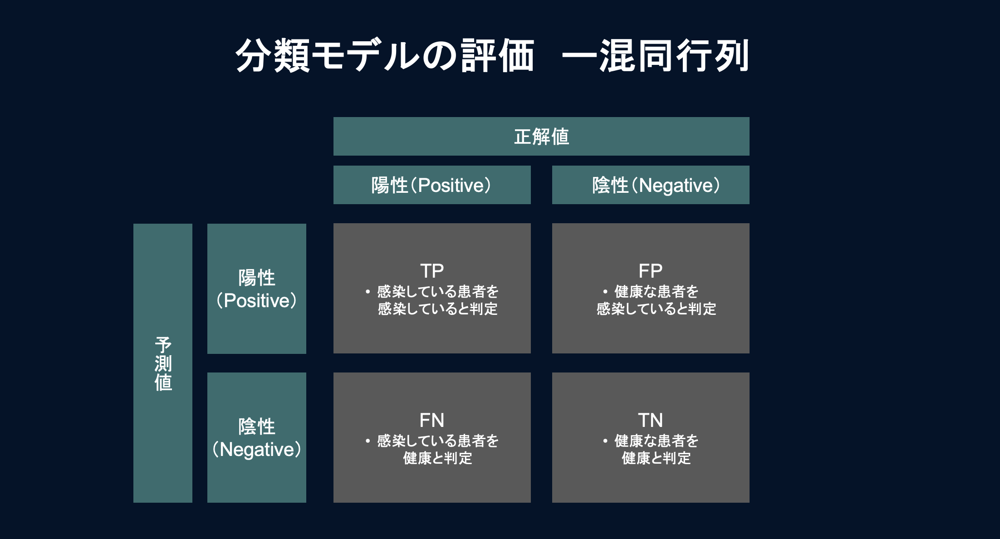

---


*   <font color=#f27405>正解率</font>（Accuracy）：(TP+TN) / (TP+TN+FP+FN)
 * 予測結果全体に対して正しく予測できた割合
 * 一番基本的な指標
 * 使用場面例：オールマイティ
*   <font color=#f27405>適合率</font>（Precision）：TP / (TP+FP)
 * ポジティブと予測したものが実際にポジティブだった割合
 * 使用場面例：メールのスパム判定（スパムと判定したものが正規の重要メールだった場合は大問題）
*   <font color=#f27405>再現率</font>（Recall）：TP / (TP+FN)
 * 実際にポジティブなものをどれくらいポジティブと予測出来たかを示す割合
 * 使用場面例：感染症の診断（陽性患者を見逃すと更なる感染の恐れ）
*   <font color=#f27405>F値</font>（F1-Score）：2×(適合率×再現率) / (適合率÷再現率)
 * 適合率と再現率の両方の傾向を反映した指標
 * 適合率と再現率はトレードオフの関係にあるため、中間となるF値を見ると良い
 * 使用場面例：オールマイティ
---

補足）<br>
「適合率と再現率がトレードオフの関係にある」ことについて説明を補足しておきます。<br>
「麻薬をやってる(黒)かどうかを予測する」テーマを例にして、直感的に理解しておきましょう。<br>


---
* 適合率：「お前黒だろと予測した人が本当に黒だった割合」
 * 要は誤認逮捕をしてないかを見る指標
 * 黒かどうか悩んだときは、なるべく白と判定した方が高くなる(=誤認逮捕が減る）
* 再現率：「実際に黒の人の中で、どれくらい黒と判定できたかを示す割合」
 * 要は検挙率
 * 黒かどうか悩んだ時には、とりあえず逮捕した方が高くなる（検挙率が上がる）


---



とすると、黒かどうか悩んだときに、<br>
* なるべく白と判定した方が適合率が高くなるが、再現率は低くなる<br>
* なるべく黒と判定した方が再現率が高くなるが、適合率は低くなる<br>

ので、これらの指標はトレードオフの関係にあるといえるわけです。<br>
<br>
もちろん、検挙率も高く誤認逮捕も少ないような理想的な状態もあるので、どちらのスコアも高いことが理想ではありますが、<br>
基本的にはどちらかを上げようとするとどちらかは下がる傾向にあることは頭に入れておきましょう。

In [ ]:
#predは確率値なので0/1の離職フラグに変換
y_pred = np.where(pred < 0.5, 0, 1)

◆正解率(Accuracy)

In [ ]:
accuracy_score(y_pred,y_test)

0.8752834467120182

◆適合率(Precision)<br>
「お前退職しそうだな」と予測した人が実際に退職する割合

In [ ]:
precision_score(y_pred,y_test)

0.3

◆再現率(Recall)<br>
実際に退職した人の中で「お前退職しそうだな」と予測できていた割合

In [ ]:
recall_score(y_pred,y_test)

0.7777777777777778

◆評価結果<br>
* 正解率(Accuracy)：87.5%
* 適合率(Precision)：30.0%
* 再現率(Recall)：77.8%

正解率と再現率はまずまずですが<br>
適合率(Precision)は低い結果となっています。<br>
<br>
これは、元々のデータの中に退職者のデータが少なかったからだと考えられます。<br>

このような偏ったデータを<font color=#f27405>不均衡データ</font>と言います。<br>
不均衡データでモデル学習/評価を行うと、良い結果が得られないケースもあります。<br>
<br>
再度、このデータに含まれる離職者と非離職者のデータ数を比較してみます。

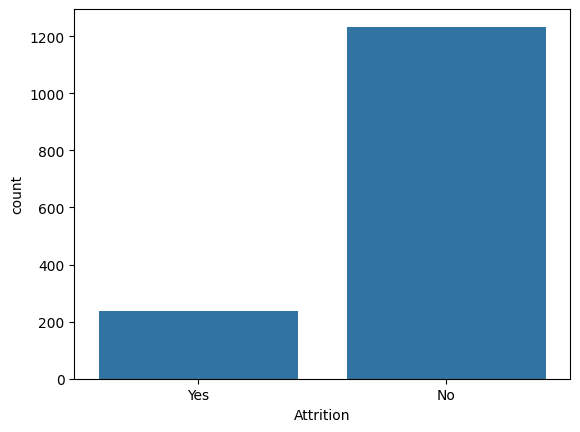

In [ ]:
#離職フラグのYes/No別の数で棒グラフを作成
sns.countplot(x="Attrition", data=df_init)
plt.show()

### <font color=#0e89b2>(3) モデル学習評価③：不均衡データ対応 SMOTE</font>

#### <font color=#0e89b2>a. SMOTEとは</font>

ここではSMOTE（Synthetic Minority Over-sampling Technique)という技術を使って、<br>
不均衡データの少数派データの水増しを行ってみます。<br>
<br>
SMOTEとは、データセットが不均衡な場合に、少数派データを合成的に作成して水増しする手法です、<br>
2002年にChawlaらによって提案され、現在ではデータ不均衡問題の解決に広く用いられています。<br>
<br>
「合成的に増やす」と聞くとピンとこないかもしれませんが、簡単に説明すると、<br>
少数派クラスの既存の2つのサンプルをランダムに選んで、<br>
その中間にあたるような新しいサンプルを作り出しています。<br>
<br>
ただし、万能な手法ではないため、精度が向上するかどうかはケースバイケースです。<br>

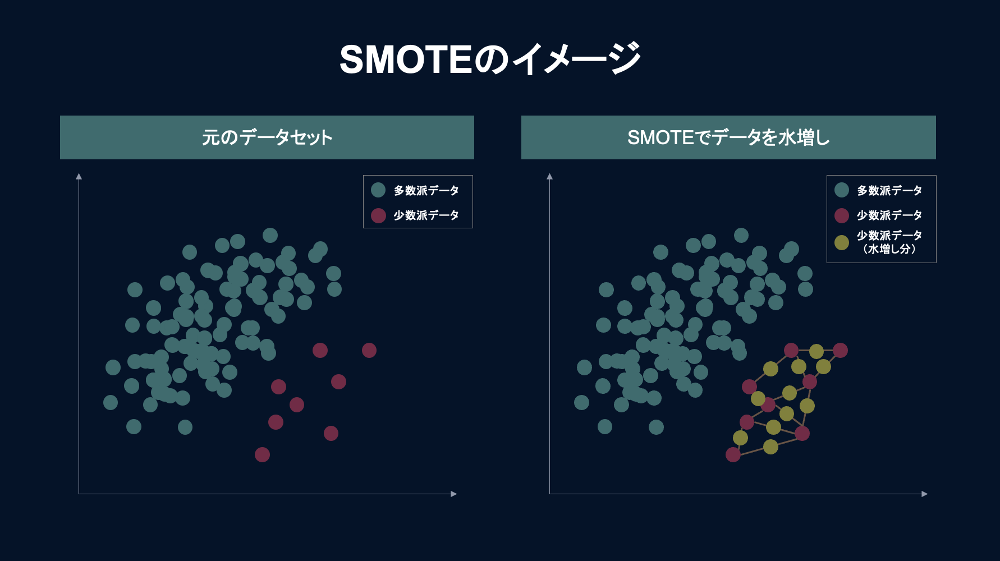

#### <font color=#0e89b2>b. SMOTEの練習</font>

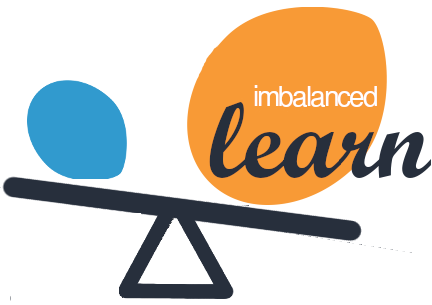

SMOTEを行う場合は、`imbalanced-learn`というライブラリを使用します。<br>
まずはデータを準備します。<br>
青に対してオレンジのデータ数が顕著に少ない不均衡データになっています。

<Axes: xlabel='X', ylabel='Y'>

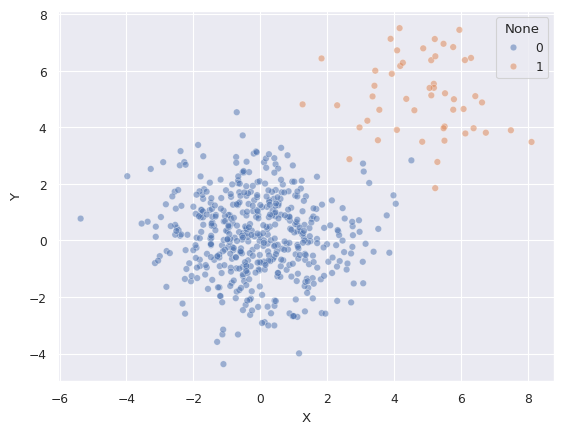

In [ ]:
from sklearn.datasets import make_blobs
#make_blobsでサンプルデータを生成
data, target = make_blobs(n_samples=1000, centers=[(0, 0), (5, 5)], n_features=2, cluster_std=1.5)
data = pd.DataFrame(data, columns=['X', 'Y'])
target = pd.Series(target)

#多数派データと少数派データに分割
majority = data[target == 0]
minority = data[target == 1].sample(50, random_state=0)

#データを再度統合して描画
data = pd.concat([majority, minority], axis=0)
target = target.loc[data.index]
sns.scatterplot(data=data, x="X", y="Y", hue=target, alpha=0.5)

このデータに対して、`imbalanced-learn`ライブラリの`SMOTE`を使って、少数派データの水増しを行なっていきます。

In [ ]:
#不均衡データの少数派データを増やすオーバサンプリング手法 SMOTE
from imblearn.over_sampling import SMOTE

In [ ]:
#SMOTE用のインスタンスを作成
oversampler = SMOTE(random_state=0)

#自動で少数派データの個数を多数派データと同じ個数まで水増し
oversampled_data, oversampled_target = oversampler.fit_resample(data, target)

<Axes: xlabel='X', ylabel='Y'>

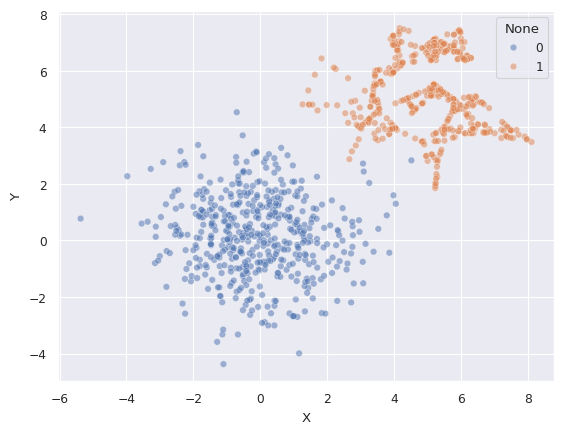

In [ ]:
#水増し後のデータを描画
sns.scatterplot(data=oversampled_data, x="X", y="Y", hue=oversampled_target, alpha=0.5)

上手くデータを水増しできている様子がわかると思います。

#### <font color=#0e89b2>c. 本題に戻ってSMOTEを実践</font>

それでは本題の退職者予測に戻ります。<br>
ここではSMOTEを使って、訓練(train)データの離職フラグが1のデータを増やしてみます。<br>
やり方は先ほどと全く同じです。

In [ ]:
#SMOTE前のデータ数確認
print("SMOTE前の訓練データ数 {}".format(len(x_train)))
print("SMOTE前の離職フラグ1の合計 {}".format(sum(y_train)))

SMOTE前の訓練データ数 1029
SMOTE前の離職フラグ1の合計 167


In [ ]:
#SMOTEを使って、訓練(train)データの離職フラグが1を増やす（オーバーサンプリング)
oversampler = SMOTE(random_state=0)
x_train, y_train = oversampler.fit_resample(x_train, y_train)

In [ ]:
#SMOTE後のデータ数確認
print("SMOTE後の訓練データ数 {}".format(len(x_train)))
print("SMOTE後の離職フラグ1の合計 {}".format(sum(y_train)))

SMOTE後の訓練データ数 1724
SMOTE後の離職フラグ1の合計 862


### <font color=#0e89b2>(4) モデル学習評価④：SMOTE後のOptunaによるハイパーパラメータの自動探索</font>

In [ ]:
#増やした訓練(train)データでOptunaでパイパーパラメータの自動探索
study = optuna.create_study(sampler=optuna.samplers.RandomSampler(seed=0))
study.optimize(objective, n_trials=50)
print("Optuna Best Parameters")
print(study.best_params)

[I 2024-01-30 18:41:34,492] A new study created in memory with name: no-name-68a3e9b8-7f24-46f4-af45-176944781996
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=38, min_child_samples=97 will be ignored. Current value: min_data_in_leaf=38
[LightGBM] [Warning] min_data_in_leaf is set=38, min_child_samples=97 will be ignored. Current value: min_data_in_leaf=38
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6411
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=38, min_child_samples=97 will be ignored. Current value: min_data_in_leaf=38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2024-01-30 18:41:34,875] Trial 0 finished with value: 0.6928109351451048 and parameters: {'num_leaves': 57, 'max_depth': 23, 'min_data_in_leaf': 38, 'max_bin': 264, 'learning_rate': 9.238119916812972e-06, 'feature_fraction': 0.7875364678399936, 'bagging_fraction': 0.6625523267576154, 'bagging_freq': 7, 'min_child_samples': 97, 'num_iterations': 95}. Best is trial 0 with value: 0.6928109351451048.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	training's binary_logloss: 0.692916	valid_1's binary_logloss: 0.692972
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	training's binary_logloss: 0.692868	valid_1's binary_logloss: 0.692935
[LightGBM] [Warning] No

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[LightGBM] [Warning] No further sp

[I 2024-01-30 18:41:35,241] Trial 1 finished with value: 0.693146083214845 and parameters: {'num_leaves': 81, 'max_depth': 17, 'min_data_in_leaf': 37, 'max_bin': 378, 'learning_rate': 3.142334455004115e-08, 'feature_fraction': 0.4522775798209244, 'bagging_fraction': 0.41213103846419546, 'bagging_freq': 6, 'min_child_samples': 79, 'num_iterations': 115}. Best is trial 0 with value: 0.6928109351451048.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	training's binary_logloss: 0.693146	valid_1's binary_logloss: 0.693146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[20]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	training's binary_logloss: 0.693146	valid_1's binary_logloss: 0.693146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

[I 2024-01-30 18:41:35,550] Trial 2 finished with value: 0.6931448549487549 and parameters: {'num_leaves': 98, 'max_depth': 25, 'min_data_in_leaf': 34, 'max_bin': 334, 'learning_rate': 6.728542208135227e-08, 'feature_fraction': 0.7839526127965143, 'bagging_fraction': 0.4860119724454279, 'bagging_freq': 7, 'min_child_samples': 55, 'num_iterations': 97}. Best is trial 0 with value: 0.6928109351451048.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=95 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=95 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6563
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=95 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2024-01-30 18:41:35,891] Trial 3 finished with value: 0.6931465988123219 and parameters: {'num_leaves': 30, 'max_depth': 24, 'min_data_in_leaf': 34, 'max_bin': 271, 'learning_rate': 1.353719244993874e-08, 'feature_fraction': 0.7705812982455262, 'bagging_fraction': 0.7672574336334528, 'bagging_freq': 5, 'min_child_samples': 95, 'num_iterations': 107}. Best is trial 0 with value: 0.6928109351451048.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[LightGBM] [Warning] N

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:36,106] Trial 4 finished with value: 0.678108413290334 and parameters: {'num_leaves': 39, 'max_depth': 15, 'min_data_in_leaf': 41, 'max_bin': 118, 'learning_rate': 0.00046490798786138425, 'feature_fraction': 0.8023827217708956, 'bagging_fraction': 0.5262295366443046, 'bagging_freq': 1, 'min_child_samples': 35, 'num_iterations': 94}. Best is trial 4 with value: 0.678108413290334.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	training's binary_logloss: 0.686809	valid_1's binary_logloss: 0.688215
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	training's binary_logloss: 0.684804	valid_1's binary_logloss: 0.686643
[LightGBM] [Warning] N

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	training's binary_logloss: 0.693146	valid_1's binary_logloss: 0.693146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	training's binary_l

[I 2024-01-30 18:41:36,443] Trial 5 finished with value: 0.6931382449400815 and parameters: {'num_leaves': 59, 'max_depth': 15, 'min_data_in_leaf': 50, 'max_bin': 130, 'learning_rate': 2.8982596640452936e-07, 'feature_fraction': 0.49678571073099775, 'bagging_fraction': 0.7918649952792391, 'bagging_freq': 2, 'min_child_samples': 49, 'num_iterations': 90}. Best is trial 4 with value: 0.678108413290334.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	training's binary_logloss: 0.693136	valid_1's binary_logloss: 0.693138
Did not meet early stopping. Best iteration is:
[90]	training's binary_logloss: 0.693136	valid_1's binary_logloss: 0.693138
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=85 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=85 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Info] Number of pos

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:36,794] Trial 6 finished with value: 0.6931395027962702 and parameters: {'num_leaves': 20, 'max_depth': 6, 'min_data_in_leaf': 40, 'max_bin': 141, 'learning_rate': 2.3772591724440764e-07, 'feature_fraction': 0.6212351023965785, 'bagging_fraction': 0.8925959379087611, 'bagging_freq': 1, 'min_child_samples': 85, 'num_iterations': 83}. Best is trial 4 with value: 0.678108413290334.


[40]	training's binary_logloss: 0.693142	valid_1's binary_logloss: 0.693143
[50]	training's binary_logloss: 0.693141	valid_1's binary_logloss: 0.693143
[60]	training's binary_logloss: 0.69314	valid_1's binary_logloss: 0.693142
[70]	training's binary_logloss: 0.693139	valid_1's binary_logloss: 0.693141
[80]	training's binary_logloss: 0.693137	valid_1's binary_logloss: 0.69314
Did not meet early stopping. Best iteration is:
[83]	training's binary_logloss: 0.693137	valid_1's binary_logloss: 0.69314


<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002197 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6805
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2024-01-30 18:41:38,008] Trial 7 finished with value: 0.6574002752441223 and parameters: {'num_leaves': 98, 'max_depth': 16, 'min_data_in_leaf': 50, 'max_bin': 282, 'learning_rate': 0.0014957019359729225, 'feature_fraction': 0.4235126753525924, 'bagging_fraction': 0.5696841775458458, 'bagging_freq': 1, 'min_child_samples': 33, 'num_iterations': 84}. Best is trial 7 with value: 0.6574002752441223.



[50]	training's binary_logloss: 0.665291	valid_1's binary_logloss: 0.6711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	training's binary_logloss: 0.659849	valid_1's binary_logloss: 0.666664
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=21, min_child_samples=60 will be ignored. Current value: min_data_in_leaf=21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.692637	valid_1's binary_logloss: 0.692789
[20]	training's binary_logloss: 0.692125	valid_1's binary_logloss: 0.692401
[30]	training's binary_logloss: 0.691585	valid_1's binary_logloss: 0.692005
[40]	training's binary_logloss: 0.691067	valid_1's binary_logloss: 0.691614
[50]	training's binary_logloss: 0.690539	valid_1's binary_logloss: 0.691246
[60]	training's binary_logloss: 0.690004	valid_1's binary_logloss: 0.690839
[70]	training's binary_logloss: 0.689486	valid_1's binary_logloss: 0.690477


[I 2024-01-30 18:41:38,661] Trial 8 finished with value: 0.6887263721356367 and parameters: {'num_leaves': 35, 'max_depth': 14, 'min_data_in_leaf': 21, 'max_bin': 308, 'learning_rate': 9.251457955283514e-05, 'feature_fraction': 0.5592336945636672, 'bagging_fraction': 0.7139488320800198, 'bagging_freq': 1, 'min_child_samples': 60, 'num_iterations': 118}. Best is trial 7 with value: 0.6574002752441223.


[80]	training's binary_logloss: 0.688964	valid_1's binary_logloss: 0.690094
[90]	training's binary_logloss: 0.688438	valid_1's binary_logloss: 0.689716
[100]	training's binary_logloss: 0.687934	valid_1's binary_logloss: 0.689353
[110]	training's binary_logloss: 0.68744	valid_1's binary_logloss: 0.689009
Did not meet early stopping. Best iteration is:
[118]	training's binary_logloss: 0.687036	valid_1's binary_logloss: 0.688726
[LightGBM] [Warning] min_data_in_leaf is set=24, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=24
[LightGBM] [Warning] min_data_in_leaf is set=24, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=24
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000571 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7531
[LightGBM] [Info] Number of data points in the train set: 1724,

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:38,880] Trial 9 finished with value: 0.6931129353034259 and parameters: {'num_leaves': 35, 'max_depth': 21, 'min_data_in_leaf': 24, 'max_bin': 315, 'learning_rate': 1.0613109636245955e-06, 'feature_fraction': 0.5099148172042701, 'bagging_fraction': 0.7519077608860498, 'bagging_freq': 1, 'min_child_samples': 84, 'num_iterations': 80}. Best is trial 7 with value: 0.6574002752441223.


[40]	training's binary_logloss: 0.693124	valid_1's binary_logloss: 0.69313
[50]	training's binary_logloss: 0.693118	valid_1's binary_logloss: 0.693126
[60]	training's binary_logloss: 0.693112	valid_1's binary_logloss: 0.693121
[70]	training's binary_logloss: 0.693106	valid_1's binary_logloss: 0.693117
[80]	training's binary_logloss: 0.6931	valid_1's binary_logloss: 0.693113
Did not meet early stopping. Best iteration is:
[80]	training's binary_logloss: 0.6931	valid_1's binary_logloss: 0.693113
[LightGBM] [Warning] min_data_in_leaf is set=42, min_child_samples=26 will be ignored. Current value: min_data_in_leaf=42
[LightGBM] [Warning] min_data_in_leaf is set=42, min_child_samples=26 will be ignored. Current value: min_data_in_leaf=42
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	training's binary_logloss: 0.693139	valid_1's binary_logloss: 0.693141
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[I 2024-01-30 18:41:39,304] Trial 10 finished with value: 0.6931223714585194 and parameters: {'num_leaves': 70, 'max_depth': 10, 'min_data_in_leaf': 42, 'max_bin': 389, 'learning_rate': 5.511527829375209e-07, 'feature_fraction': 0.7456944006507021, 'bagging_fraction': 0.7552251587631034, 'bagging_freq': 5, 'min_child_samples': 26, 'num_iterations': 119}. Best is trial 7 with value: 0.6574002752441223.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	training's binary_logloss: 0.693122	valid_1's binary_logloss: 0.693128
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	training's binary_logloss: 0.644047	valid_1's binary_logloss: 0.656863
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[I 2024-01-30 18:41:39,656] Trial 11 finished with value: 0.5459563570725591 and parameters: {'num_leaves': 47, 'max_depth': 26, 'min_data_in_leaf': 41, 'max_bin': 189, 'learning_rate': 0.004972613880453016, 'feature_fraction': 0.6379034445081908, 'bagging_fraction': 0.928661918266697, 'bagging_freq': 5, 'min_child_samples': 89, 'num_iterations': 108}. Best is trial 11 with value: 0.5459563570725591.



[90]	training's binary_logloss: 0.513322	valid_1's binary_logloss: 0.564069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	training's binary_logloss: 0.498312	valid_1's binary_logloss: 0.553798
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:39,841] Trial 12 finished with value: 0.6928749583743509 and parameters: {'num_leaves': 74, 'max_depth': 17, 'min_data_in_leaf': 49, 'max_bin': 293, 'learning_rate': 9.267985377369853e-06, 'feature_fraction': 0.7638359284767546, 'bagging_fraction': 0.41151591898560014, 'bagging_freq': 3, 'min_child_samples': 68, 'num_iterations': 91}. Best is trial 11 with value: 0.5459563570725591.
<ipython-input-128-68117f064057>:12: FutureWarning: sugges

[70]	training's binary_logloss: 0.692888	valid_1's binary_logloss: 0.692938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.692851	valid_1's binary_logloss: 0.692909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[I 2024-01-30 18:41:40,229] Trial 13 finished with value: 0.6892104907344009 and parameters: {'num_leaves': 64, 'max_depth': 15, 'min_data_in_leaf': 24, 'max_bin': 189, 'learning_rate': 9.766846785544387e-05, 'feature_fraction': 0.754523656748904, 'bagging_fraction': 0.7445951493097474, 'bagging_freq': 5, 'min_child_samples': 67, 'num_iterations': 97}. Best is trial 11 with value: 0.5459563570725591.



Did not meet early stopping. Best iteration is:
[97]	training's binary_logloss: 0.687718	valid_1's binary_logloss: 0.68921
[LightGBM] [Warning] min_data_in_leaf is set=33, min_child_samples=73 will be ignored. Current value: min_data_in_leaf=33
[LightGBM] [Warning] min_data_in_leaf is set=33, min_child_samples=73 will be ignored. Current value: min_data_in_leaf=33
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8099
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=33, min_child_samples=73 will be ignored. Current value: min_data_in_leaf=33
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
T

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:40,593] Trial 14 finished with value: 0.5609168526478783 and parameters: {'num_leaves': 91, 'max_depth': 13, 'min_data_in_leaf': 33, 'max_bin': 368, 'learning_rate': 0.004399040124938485, 'feature_fraction': 0.8223331501242198, 'bagging_fraction': 0.4601361323873807, 'bagging_freq': 7, 'min_child_samples': 73, 'num_iterations': 120}. Best is trial 11 with value: 0.5459563570725591.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	training's binary_logloss: 0.591284	valid_1's binary_logloss: 0.615837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=25
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6873
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[20]	training's binary_logloss: 0.693146	valid_1's binary_logloss: 0.693147
[30]	training's binary_logloss: 0.693146	valid_1's binary_logloss: 0.693146
[40]	training's binary_logloss: 0

[I 2024-01-30 18:41:40,849] Trial 15 finished with value: 0.693144542772639 and parameters: {'num_leaves': 19, 'max_depth': 27, 'min_data_in_leaf': 25, 'max_bin': 285, 'learning_rate': 7.35766279341796e-08, 'feature_fraction': 0.9088049375933407, 'bagging_fraction': 0.8843913752350064, 'bagging_freq': 4, 'min_child_samples': 44, 'num_iterations': 82}. Best is trial 11 with value: 0.5459563570725591.



[LightGBM] [Warning] min_data_in_leaf is set=42, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=42
[LightGBM] [Warning] min_data_in_leaf is set=42, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=42
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7943
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=42, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:41,079] Trial 16 finished with value: 0.33365184784941077 and parameters: {'num_leaves': 71, 'max_depth': 15, 'min_data_in_leaf': 42, 'max_bin': 360, 'learning_rate': 0.06739854716247852, 'feature_fraction': 0.9134820054355666, 'bagging_fraction': 0.4070284505110012, 'bagging_freq': 3, 'min_child_samples': 75, 'num_iterations': 87}. Best is trial 16 with value: 0.33365184784941077.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.159336	valid_1's binary_logloss: 0.337747
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[87]	training's binary_logloss: 0.14728	valid_1's binary_logloss: 0.333652
[LightGBM] [Warning] min_data_in_leaf is set=26, mi

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:41,446] Trial 18 finished with value: 0.3653118240944996 and parameters: {'num_leaves': 20, 'max_depth': 20, 'min_data_in_leaf': 37, 'max_bin': 171, 'learning_rate': 0.034633627808266586, 'feature_fraction': 0.7683795735795376, 'bagging_fraction': 0.7213796818149749, 'bagging_freq': 5, 'min_child_samples': 75, 'num_iterations': 92}. Best is trial 16 with value: 0.33365184784941077.


[LightGBM] [Warning] min_data_in_leaf is set=37, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=37
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4756
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=37, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=37
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.548293	valid_1's binary_logloss: 0.585738
[20]	training's binary_logloss: 0.454684	valid_1's binary_logloss: 0.519267
[30]	training's binary_logloss: 0.387284	valid_1's binary_logloss: 0.479061
[40]	training's binary_logloss: 0

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=25
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=25
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8268
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=25, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2024-01-30 18:41:41,802] Trial 19 finished with value: 0.6422373124041568 and parameters: {'num_leaves': 43, 'max_depth': 8, 'min_data_in_leaf': 25, 'max_bin': 384, 'learning_rate': 0.0015026421446496271, 'feature_fraction': 0.6942752851705403, 'bagging_fraction': 0.5364487767839939, 'bagging_freq': 2, 'min_child_samples': 10, 'num_iterations': 97}. Best is trial 16 with value: 0.33365184784941077.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	training's binary_logloss: 0.642352	valid_1's binary_logloss: 0.655193
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:42,066] Trial 20 finished with value: 0.6931465273629837 and parameters: {'num_leaves': 34, 'max_depth': 22, 'min_data_in_leaf': 31, 'max_bin': 154, 'learning_rate': 1.4885077451051134e-08, 'feature_fraction': 0.4403497788779492, 'bagging_fraction': 0.8076356640991404, 'bagging_freq': 4, 'min_child_samples': 56, 'num_iterations': 116}. Best is trial 16 with value: 0.33365184784941077.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[40]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=61 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4974
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=61 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

[I 2024-01-30 18:41:42,352] Trial 21 finished with value: 0.693146584293569 and parameters: {'num_leaves': 100, 'max_depth': 9, 'min_data_in_leaf': 40, 'max_bin': 179, 'learning_rate': 1.3949447164128929e-08, 'feature_fraction': 0.8550271923016849, 'bagging_fraction': 0.5920102904934808, 'bagging_freq': 3, 'min_child_samples': 61, 'num_iterations': 114}. Best is trial 16 with value: 0.33365184784941077.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	training's binary_logloss: 0.693145	valid_1's binary_logloss: 0.693145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	training's binary_l

[I 2024-01-30 18:41:42,944] Trial 22 finished with value: 0.6931377034724643 and parameters: {'num_leaves': 65, 'max_depth': 27, 'min_data_in_leaf': 28, 'max_bin': 340, 'learning_rate': 1.9927444586868056e-07, 'feature_fraction': 0.9716749941831667, 'bagging_fraction': 0.8124929658326892, 'bagging_freq': 2, 'min_child_samples': 95, 'num_iterations': 109}. Best is trial 16 with value: 0.33365184784941077.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[109]	training's binary_logloss: 0.693134	valid_1's binary_logloss: 0.693138
[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000828 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3176
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=36, m

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:43,193] Trial 23 finished with value: 0.6931363183418512 and parameters: {'num_leaves': 29, 'max_depth': 8, 'min_data_in_leaf': 36, 'max_bin': 107, 'learning_rate': 2.8332867334557567e-07, 'feature_fraction': 0.6548112812509037, 'bagging_fraction': 0.6245019882005354, 'bagging_freq': 4, 'min_child_samples': 31, 'num_iterations': 104}. Best is trial 16 with value: 0.33365184784941077.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.693136	valid_1's binary_logloss: 0.693139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:43,448] Trial 24 finished with value: 0.6563241812424915 and parameters: {'num_leaves': 87, 'max_depth': 6, 'min_data_in_leaf': 36, 'max_bin': 139, 'learning_rate': 0.0010423600747379064, 'feature_fraction': 0.6376358216843763, 'bagging_fraction': 0.7392527871151053, 'bagging_freq': 2, 'min_child_samples': 18, 'num_iterations': 100}. Best is trial 16 with value: 0.33365184784941077.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	training's binary_logloss: 0.667582	valid_1's binary_logloss: 0.674076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:43,697] Trial 25 finished with value: 0.4085896735943736 and parameters: {'num_leaves': 39, 'max_depth': 29, 'min_data_in_leaf': 43, 'max_bin': 325, 'learning_rate': 0.021185473656037093, 'feature_fraction': 0.4500534612652112, 'bagging_fraction': 0.731315481953444, 'bagging_freq': 5, 'min_child_samples': 97, 'num_iterations': 91}. Best is trial 16 with value: 0.33365184784941077.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	training's binary_logloss: 0.541358	valid_1's binary_logloss: 0.579219
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8174
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[I 2024-01-30 18:41:44,036] Trial 26 finished with value: 0.6743133914935996 and parameters: {'num_leaves': 28, 'max_depth': 5, 'min_data_in_leaf': 20, 'max_bin': 379, 'learning_rate': 0.0004891204558509285, 'feature_fraction': 0.8710917472138826, 'bagging_fraction': 0.5690380634523695, 'bagging_freq': 5, 'min_child_samples': 11, 'num_iterations': 99}. Best is trial 16 with value: 0.33365184784941077.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.672412	valid_1's binary_logloss: 0.677738
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	training's binary_logloss: 0.693142	valid_1's binary_logloss: 0.693143
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[I 2024-01-30 18:41:44,733] Trial 27 finished with value: 0.6931252325800413 and parameters: {'num_leaves': 98, 'max_depth': 27, 'min_data_in_leaf': 30, 'max_bin': 389, 'learning_rate': 4.187081219855492e-07, 'feature_fraction': 0.9695912934494089, 'bagging_fraction': 0.9648266228238992, 'bagging_freq': 6, 'min_child_samples': 65, 'num_iterations': 115}. Best is trial 16 with value: 0.33365184784941077.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	training's binary_logloss: 0.693124	valid_1's binary_logloss: 0.69313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:44,964] Trial 28 finished with value: 0.6930388872981236 and parameters: {'num_leaves': 33, 'max_depth': 26, 'min_data_in_leaf': 39, 'max_bin': 103, 'learning_rate': 2.6954707630204607e-06, 'feature_fraction': 0.48888451656889903, 'bagging_fraction': 0.989097633890952, 'bagging_freq': 4, 'min_child_samples': 52, 'num_iterations': 106}. Best is trial 16 with value: 0.33365184784941077.


[10]	training's binary_logloss: 0.693134	valid_1's binary_logloss: 0.693137
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	training's binary_logloss: 0.69312	valid_1's binary_logloss: 0.693127
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	training's binary_logloss: 0.693105	valid_1's binary_logloss: 0.693116
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	training's binary_logloss: 0.693091	valid_1's binary_logloss: 0.693106
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	training's binary

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:45,186] Trial 29 finished with value: 0.6917503076561967 and parameters: {'num_leaves': 40, 'max_depth': 6, 'min_data_in_leaf': 45, 'max_bin': 157, 'learning_rate': 3.7951843618009864e-05, 'feature_fraction': 0.5345902173848436, 'bagging_fraction': 0.45870669069642045, 'bagging_freq': 7, 'min_child_samples': 98, 'num_iterations': 119}. Best is trial 16 with value: 0.33365184784941077.


[LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=98 will be ignored. Current value: min_data_in_leaf=45
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4474
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=45, min_child_samples=98 will be ignored. Current value: min_data_in_leaf=45
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:45,380] Trial 30 finished with value: 0.6929437920301238 and parameters: {'num_leaves': 92, 'max_depth': 24, 'min_data_in_leaf': 30, 'max_bin': 124, 'learning_rate': 7.090685120826838e-06, 'feature_fraction': 0.5393404853025656, 'bagging_fraction': 0.4794925808547898, 'bagging_freq': 1, 'min_child_samples': 74, 'num_iterations': 80}. Best is trial 16 with value: 0.33365184784941077.
<ipython-input-128-68117f064057>:12: FutureWarning: sugges

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3674
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2024-01-30 18:41:45,736] Trial 31 finished with value: 0.6720556182882913 and parameters: {'num_leaves': 78, 'max_depth': 7, 'min_data_in_leaf': 22, 'max_bin': 126, 'learning_rate': 0.0005062145822365342, 'feature_fraction': 0.5472203259117069, 'bagging_fraction': 0.6523236800080591, 'bagging_freq': 4, 'min_child_samples': 87, 'num_iterations': 109}. Best is trial 16 with value: 0.33365184784941077.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.671512	valid_1's binary_logloss: 0.677349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:45,989] Trial 32 finished with value: 0.693119621708063 and parameters: {'num_leaves': 30, 'max_depth': 6, 'min_data_in_leaf': 21, 'max_bin': 190, 'learning_rate': 6.836393375607089e-07, 'feature_fraction': 0.6736843400802879, 'bagging_fraction': 0.8099688013286083, 'bagging_freq': 5, 'min_child_samples': 32, 'num_iterations': 95}. Best is trial 16 with value: 0.33365184784941077.


[40]	training's binary_logloss: 0.693131	valid_1's binary_logloss: 0.693136
[50]	training's binary_logloss: 0.693127	valid_1's binary_logloss: 0.693133
[60]	training's binary_logloss: 0.693123	valid_1's binary_logloss: 0.69313
[70]	training's binary_logloss: 0.693119	valid_1's binary_logloss: 0.693127
[80]	training's binary_logloss: 0.693116	valid_1's binary_logloss: 0.693124
[90]	training's binary_logloss: 0.693111	valid_1's binary_logloss: 0.693121
Did not meet early stopping. Best iteration is:
[95]	training's binary_logloss: 0.69311	valid_1's binary_logloss: 0.69312
[LightGBM] [Warning] min_data_in_leaf is set=21, min_child_samples=61 will be ignored. Current value: min_data_in_leaf=21
[LightGBM] [Warning] min_data_in_leaf is set=21, min_child_samples=61 will be ignored. Current value: min_data_in_leaf=21
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:46,271] Trial 33 finished with value: 0.6062398201957013 and parameters: {'num_leaves': 22, 'max_depth': 25, 'min_data_in_leaf': 21, 'max_bin': 309, 'learning_rate': 0.0028240200226216537, 'feature_fraction': 0.866444537109252, 'bagging_fraction': 0.555653538607213, 'bagging_freq': 3, 'min_child_samples': 61, 'num_iterations': 91}. Best is trial 16 with value: 0.33365184784941077.


[20]	training's binary_logloss: 0.662648	valid_1's binary_logloss: 0.670395
[30]	training's binary_logloss: 0.648409	valid_1's binary_logloss: 0.659833
[40]	training's binary_logloss: 0.635197	valid_1's binary_logloss: 0.650338
[50]	training's binary_logloss: 0.622097	valid_1's binary_logloss: 0.641271
[60]	training's binary_logloss: 0.609246	valid_1's binary_logloss: 0.631898
[70]	training's binary_logloss: 0.597629	valid_1's binary_logloss: 0.623727
[80]	training's binary_logloss: 0.585687	valid_1's binary_logloss: 0.614968
[90]	training's binary_logloss: 0.574565	valid_1's binary_logloss: 0.606964
Did not meet early stopping. Best iteration is:
[91]	training's binary_logloss: 0.573496	valid_1's binary_logloss: 0.60624


<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=60 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=60 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3351
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=34, min_child_samples=60 will be ignored. Current value: min_data_in_leaf=34
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2024-01-30 18:41:46,567] Trial 34 finished with value: 0.5635796305482802 and parameters: {'num_leaves': 40, 'max_depth': 8, 'min_data_in_leaf': 34, 'max_bin': 113, 'learning_rate': 0.00396799569217958, 'feature_fraction': 0.4461738681919797, 'bagging_fraction': 0.7113010892989156, 'bagging_freq': 3, 'min_child_samples': 60, 'num_iterations': 119}. Best is trial 16 with value: 0.33365184784941077.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	training's binary_logloss: 0.539347	valid_1's binary_logloss: 0.579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[110]	training's binary_lo

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:46,715] Trial 35 finished with value: 0.6910193025550225 and parameters: {'num_leaves': 66, 'max_depth': 3, 'min_data_in_leaf': 33, 'max_bin': 253, 'learning_rate': 5.665555038904806e-05, 'feature_fraction': 0.8088355063623027, 'bagging_fraction': 0.5665576586390597, 'bagging_freq': 1, 'min_child_samples': 42, 'num_iterations': 119}. Best is trial 16 with value: 0.33365184784941077.
<ipython-input-128-68117f064057>:12: FutureWarning: sugges

[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=91 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=91 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000667 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6153
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=36, min_child_samples=91 will be ignored. Current value: min_data_in_leaf=36
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.622754	valid_1's binary_logloss: 0.641861
[20]	training's binary_logloss: 0.565037	valid_1's binary_loglo

[I 2024-01-30 18:41:46,974] Trial 36 finished with value: 0.4271209820885347 and parameters: {'num_leaves': 22, 'max_depth': 28, 'min_data_in_leaf': 36, 'max_bin': 237, 'learning_rate': 0.014937911138380881, 'feature_fraction': 0.6751623770611515, 'bagging_fraction': 0.834500581966926, 'bagging_freq': 3, 'min_child_samples': 91, 'num_iterations': 108}. Best is trial 16 with value: 0.33365184784941077.


[100]	training's binary_logloss: 0.310723	valid_1's binary_logloss: 0.435723
Did not meet early stopping. Best iteration is:
[108]	training's binary_logloss: 0.296164	valid_1's binary_logloss: 0.427121
[LightGBM] [Warning] min_data_in_leaf is set=43, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=43
[LightGBM] [Warning] min_data_in_leaf is set=43, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=43
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7010
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=43, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.00000

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:47,284] Trial 37 finished with value: 0.6931294186277462 and parameters: {'num_leaves': 72, 'max_depth': 12, 'min_data_in_leaf': 43, 'max_bin': 291, 'learning_rate': 4.787865190077151e-07, 'feature_fraction': 0.4963232934911539, 'bagging_fraction': 0.877834884710399, 'bagging_freq': 7, 'min_child_samples': 48, 'num_iterations': 104}. Best is trial 16 with value: 0.33365184784941077.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	training's binary_logloss: 0.693133	valid_1's binary_logloss: 0.693137
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	training's binary_logloss: 0.63707	valid_1's binary_logloss: 0.652462
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[I 2024-01-30 18:41:47,666] Trial 38 finished with value: 0.5505643995394796 and parameters: {'num_leaves': 87, 'max_depth': 15, 'min_data_in_leaf': 49, 'max_bin': 273, 'learning_rate': 0.005563778666223539, 'feature_fraction': 0.945306231047643, 'bagging_fraction': 0.8893142912611414, 'bagging_freq': 2, 'min_child_samples': 65, 'num_iterations': 96}. Best is trial 16 with value: 0.33365184784941077.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.51738	valid_1's binary_logloss: 0.566287
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:47,853] Trial 39 finished with value: 0.6931466081795936 and parameters: {'num_leaves': 11, 'max_depth': 14, 'min_data_in_leaf': 28, 'max_bin': 355, 'learning_rate': 1.7105366578849403e-08, 'feature_fraction': 0.9753896331180841, 'bagging_fraction': 0.6132213090831578, 'bagging_freq': 3, 'min_child_samples': 6, 'num_iterations': 87}. Best is trial 16 with value: 0.33365184784941077.
<ipython-input-128-68117f064057>:12: FutureWarning: sugges

[50]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[60]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[70]	training's binary_logloss: 0.693147	valid_1's binary_logloss: 0.693147
[80]	training's binary_logloss: 0.693146	valid_1's binary_logloss: 0.693147
Did not meet early stopping. Best iteration is:
[87]	training's binary_logloss: 0.693146	valid_1's binary_logloss: 0.693147
[LightGBM] [Warning] min_data_in_leaf is set=23, min_child_samples=63 will be ignored. Current value: min_data_in_leaf=23
[LightGBM] [Warning] min_data_in_leaf is set=23, min_child_samples=63 will be ignored. Current value: min_data_in_leaf=23
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001098 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8268
[LightGBM] [Info] Number of data points in the train set: 1724, n

[I 2024-01-30 18:41:48,222] Trial 40 finished with value: 0.4756991541667782 and parameters: {'num_leaves': 43, 'max_depth': 29, 'min_data_in_leaf': 23, 'max_bin': 384, 'learning_rate': 0.012201682325820903, 'feature_fraction': 0.672497438144531, 'bagging_fraction': 0.596020529060956, 'bagging_freq': 2, 'min_child_samples': 63, 'num_iterations': 81}. Best is trial 16 with value: 0.33365184784941077.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:48,347] Trial 41 finished with value: 0.6

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Did not meet early stopping. Best iteration is:
[81]	training's binary_logloss: 0.377968	valid_1's binary_logloss: 0.475699
[LightGBM] [Warning] min_data_in_leaf is set=22, min_child_samples=16 will be ignored. Current value: min_data_in_leaf=22
[LightGBM] [Warning] min_data_in_leaf is set=22, min_child_samples=16 will be ignored. Current value: min_data_in_leaf=22
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4868
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=22, min_child_samples=16 will be ignored. Current value: min_data_in_leaf=22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
T

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	training's binary_logloss: 0.691473	valid_1's binary_logloss: 0.69196
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	training's binary_logloss: 0.689762	valid_1's binary_logloss: 0.690702
[LightGBM] [Warning] No

[I 2024-01-30 18:41:48,937] Trial 42 finished with value: 0.6820560003195812 and parameters: {'num_leaves': 98, 'max_depth': 30, 'min_data_in_leaf': 32, 'max_bin': 149, 'learning_rate': 0.0002960276663692278, 'feature_fraction': 0.6941832079292423, 'bagging_fraction': 0.9936458663706589, 'bagging_freq': 1, 'min_child_samples': 80, 'num_iterations': 91}. Best is trial 16 with value: 0.33365184784941077.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	training's binary_logloss: 0.679681	valid_1's binary_logloss: 0.683346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	training's binary_logloss: 0.678013	valid_1's binary_logloss: 0.682153
[LightGBM] [Warning] No

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[10]	training's binary_logloss: 0.69292	valid_1's binary_logloss: 0.692984
[20]	training's binary_logloss: 0.692693	valid_1's binary_logloss: 0.692816
[30]	training's binary_logloss: 0.692459	valid_1's binary_logloss: 0.692648
[40]	training's binary_logloss: 0.692231	valid_1's binary_logloss: 0.69248
[50]	training's binary_logloss: 0.692002	valid_1's binary_logloss: 0.692318
[60]	training's binary_logloss: 0.691772	valid_1's binary_logloss: 0.69214
[70]	training's binary_logloss: 0.69155	valid_1's binary_logloss: 0.691979
[80]	training's binary_logloss: 0.691324	valid_1's binary_logloss: 0.691814


[I 2024-01-30 18:41:49,610] Trial 43 finished with value: 0.6915252185337389 and parameters: {'num_leaves': 28, 'max_depth': 21, 'min_data_in_leaf': 27, 'max_bin': 300, 'learning_rate': 4.179839640733024e-05, 'feature_fraction': 0.6544533930615095, 'bagging_fraction': 0.7328126851968514, 'bagging_freq': 3, 'min_child_samples': 72, 'num_iterations': 97}. Best is trial 16 with value: 0.33365184784941077.


[90]	training's binary_logloss: 0.691099	valid_1's binary_logloss: 0.691645
Did not meet early stopping. Best iteration is:
[97]	training's binary_logloss: 0.69094	valid_1's binary_logloss: 0.691525
[LightGBM] [Warning] min_data_in_leaf is set=48, min_child_samples=98 will be ignored. Current value: min_data_in_leaf=48
[LightGBM] [Warning] min_data_in_leaf is set=48, min_child_samples=98 will be ignored. Current value: min_data_in_leaf=48
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3351
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=48, min_child_samples=98 will be ignored. Current value: min_data_in_leaf=48
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	training's binary_logloss: 0.693145	valid_1's binary_logloss: 0.693146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[I 2024-01-30 18:41:50,855] Trial 44 finished with value: 0.6931287039565027 and parameters: {'num_leaves': 39, 'max_depth': 26, 'min_data_in_leaf': 48, 'max_bin': 113, 'learning_rate': 4.25000019335198e-07, 'feature_fraction': 0.6091116216955379, 'bagging_fraction': 0.8889798876221484, 'bagging_freq': 7, 'min_child_samples': 98, 'num_iterations': 117}. Best is trial 16 with value: 0.33365184784941077.
<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=27, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=27
[LightGBM] [Warning] min_data_in_leaf is set=27, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=27
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3750
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=27, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.504481	valid_1's binary_logloss: 0.565065
[20]	training's binary_logloss: 0.385096	valid_1's binary_loglo

[I 2024-01-30 18:41:51,191] Trial 45 finished with value: 0.3330108546766965 and parameters: {'num_leaves': 33, 'max_depth': 30, 'min_data_in_leaf': 27, 'max_bin': 131, 'learning_rate': 0.04535950195581653, 'feature_fraction': 0.5400521532808578, 'bagging_fraction': 0.8138609590466503, 'bagging_freq': 1, 'min_child_samples': 75, 'num_iterations': 116}. Best is trial 45 with value: 0.3330108546766965.


[70]	training's binary_logloss: 0.145512	valid_1's binary_logloss: 0.349286
[80]	training's binary_logloss: 0.123439	valid_1's binary_logloss: 0.34354
[90]	training's binary_logloss: 0.105244	valid_1's binary_logloss: 0.337889
[100]	training's binary_logloss: 0.0900665	valid_1's binary_logloss: 0.334524
[110]	training's binary_logloss: 0.0768932	valid_1's binary_logloss: 0.333888
Did not meet early stopping. Best iteration is:
[116]	training's binary_logloss: 0.0704363	valid_1's binary_logloss: 0.333011
[LightGBM] [Warning] min_data_in_leaf is set=31, min_child_samples=85 will be ignored. Current value: min_data_in_leaf=31
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] min_data_in_leaf is set=31, min_child_samples=85 will be ignored. Current value: min_data_in_leaf=31
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:51,472] Trial 46 finished with value: 0.6931316529394579 and parameters: {'num_leaves': 31, 'max_depth': 13, 'min_data_in_leaf': 31, 'max_bin': 325, 'learning_rate': 4.620092787381713e-07, 'feature_fraction': 0.5031118594285858, 'bagging_fraction': 0.6695749892126428, 'bagging_freq': 3, 'min_child_samples': 85, 'num_iterations': 89}. Best is trial 45 with value: 0.3330108546766965.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	training's binary_logloss: 0.693138	valid_1's binary_logloss: 0.69314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	training's binary_logloss: 0.533503	valid_1's binary_logloss: 0.581541
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

[I 2024-01-30 18:41:51,882] Trial 47 finished with value: 0.3603301900814669 and parameters: {'num_leaves': 53, 'max_depth': 29, 'min_data_in_leaf': 39, 'max_bin': 361, 'learning_rate': 0.03814765317106369, 'feature_fraction': 0.8504589171318111, 'bagging_fraction': 0.8197450361348508, 'bagging_freq': 7, 'min_child_samples': 100, 'num_iterations': 98}. Best is trial 45 with value: 0.3330108546766965.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	training's binary_logloss: 0.195783	valid_1's binary_logloss: 0.383079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

<ipython-input-128-68117f064057>:12: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 0.1),
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
[I 2024-01-30 18:41:52,077] Trial 48 finished with value: 0.6931440619696337 and parameters: {'num_leaves': 11, 'max_depth': 11, 'min_data_in_leaf': 24, 'max_bin': 225, 'learning_rate': 8.298991109001528e-08, 'feature_fraction': 0.7624706824125291, 'bagging_fraction': 0.6296848354947124, 'bagging_freq': 7, 'min_child_samples': 97, 'num_iterations': 102}. Best is trial 45 with value: 0.3330108546766965.
<ipython-input-128-68117f064057>:12: FutureWarning: sugges

[20]	training's binary_logloss: 0.693146	valid_1's binary_logloss: 0.693147
[30]	training's binary_logloss: 0.693146	valid_1's binary_logloss: 0.693146
[40]	training's binary_logloss: 0.693146	valid_1's binary_logloss: 0.693146
[50]	training's binary_logloss: 0.693145	valid_1's binary_logloss: 0.693146
[60]	training's binary_logloss: 0.693145	valid_1's binary_logloss: 0.693145
[70]	training's binary_logloss: 0.693144	valid_1's binary_logloss: 0.693145
[80]	training's binary_logloss: 0.693144	valid_1's binary_logloss: 0.693145
[90]	training's binary_logloss: 0.693144	valid_1's binary_logloss: 0.693144
[100]	training's binary_logloss: 0.693143	valid_1's binary_logloss: 0.693144
Did not meet early stopping. Best iteration is:
[102]	training's binary_logloss: 0.693143	valid_1's binary_logloss: 0.693144
[LightGBM] [Warning] min_data_in_leaf is set=47, min_child_samples=28 will be ignored. Current value: min_data_in_leaf=47
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly

[I 2024-01-30 18:41:52,319] Trial 49 finished with value: 0.6906578179013274 and parameters: {'num_leaves': 31, 'max_depth': 19, 'min_data_in_leaf': 47, 'max_bin': 222, 'learning_rate': 7.320621227780115e-05, 'feature_fraction': 0.5629916605636875, 'bagging_fraction': 0.6732664896700162, 'bagging_freq': 3, 'min_child_samples': 28, 'num_iterations': 100}. Best is trial 45 with value: 0.3330108546766965.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	training's binary_logloss: 0.69252	valid_1's binary_logloss: 0.692666
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	training's binary_logloss: 0.692185	valid_1's binary_logloss: 0.692409
[LightGBM] [Warning] No 

### <font color=#0e89b2>(5) モデル学習評価⑤：SMOTE後のOptunaで求めたハイパーパラメータを用いてモデル構築</font>

In [ ]:

#Optunaで求めたハイパーパラメータ(Optunaのログの最後)
params = {"objective":"binary",
           'num_leaves': 33,
           'max_depth': 30,
           'min_data_in_leaf': 27,
           'max_bin': 131,
           'learning_rate': 0.04535950195581653,
           'feature_fraction': 0.5400521532808578,
           'bagging_fraction': 0.8138609590466503,
           'bagging_freq': 1,
           'min_child_samples': 75,
           'num_iterations': 116
          }

#LightGBM訓練(train)データ設定
lgb_train = lgb.Dataset(x_train, y_train)

#LightGBM評価(test)データ設定
lgb_eval = lgb.Dataset(x_test, y_test, reference=lgb_train)

#LightGBM学習設定
model = lgb.train(params, lgb_train,
                valid_sets=[lgb_train, lgb_eval],
                callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=1),
                lgb.log_evaluation(10),],
                num_boost_round=2000)

#評価(test)データの推論
pred = model.predict(x_test)

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:172: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=27, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=27
[LightGBM] [Warning] min_data_in_leaf is set=27, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=27
[LightGBM] [Info] Number of positive: 862, number of negative: 862
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3750
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 31
[LightGBM] [Warning] min_data_in_leaf is set=27, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=27
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.504481	valid_1's binary_logloss: 0.565065
[20]	training's binary_logloss: 0.385096	valid_1's binary_loglo

In [ ]:
#predは確率なので0/1の離職フラグに変換
y_pred = np.where(pred < 0.5, 0, 1)

◆正解率(Accuracy)

In [ ]:
accuracy_score(y_pred,y_test)

0.8752834467120182

◆適合率(Precision)<br>
「お前退職しそうだな」と予測した人が実際に退職する割合

In [ ]:
precision_score(y_pred,y_test)

0.35714285714285715

◆再現率(Recall)<br>
実際に退職した人の中で「お前退職しそうだな」と予測できていた割合

In [ ]:
recall_score(y_pred,y_test)

0.7142857142857143

◆評価結果（SMOTE前）<br>
* 正解率(Accuracy)：87.5%
* 適合率(Precision)：30.0%
* 再現率(Recall)：77.8%

◆評価結果（SMOTE後）<br>
* 正解率(Accuracy)：87.5%
* 適合率(Precision)：35.7%
* 再現率(Recall)：71.4%


評価結果を見ると正解率(Accuracy)はSMOTE前は変わらず、適合率(Precision)は上がりました。<br>
しかし、適合率(Precision)と再現率(Recall)はトレードオフの関係なので、再現率(Recall)は低下しています。<br>
<br>
今回はSMOTEによって評価が全体的に劇的に上がることはありませんでしたが、<br>
やや性質の異なるモデルが出来上がりました。<br>
実務では、より目的に合致する方を選ぶと良いでしょう。


# <font color=#0e89b2>4. 追加演習：クレジットカードの不正検知</font>

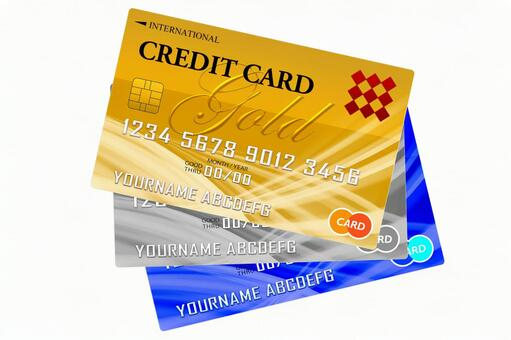

ここからは、本セクションで学んだOptunaとSMOTEをさらに身につけていくために、追加演習を行なっていきます。<br>
<br>
こちらのデータは、クレジットカードの利用状況とそれが不正利用であったか否かが記録されたものです。<br>
このデータを使って、クレジットカードの不正利用を検知するモデルを作成しましょう。<br>
https://drive.google.com/file/d/1bG2alH0DQSjnQ4egkD79N6HjhTsnjRG2/view?usp=drive_link

## <font color=#0e89b2>4.1 データの準備</font>

まずはデータを準備していきます。<br>
今回のデータは容量が大きいため、これまでのようにColab上にファイルを直接アップロードする形式だと、<br>
時間がかかってしまいます。<br>
<br>
そこで今回は、「ドライブマウント」を使います。<br>
1. まずはあなたのGoogleアカウントのドライブ上に、ダウンロードしたcredit.csvファイルをアップロードしてください。<br>
2. 次にこちらのコードを実行してください。Googleアカウントの認証画面が出てくるので、無事認証を完了すると、マウントが完了します。<br>


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


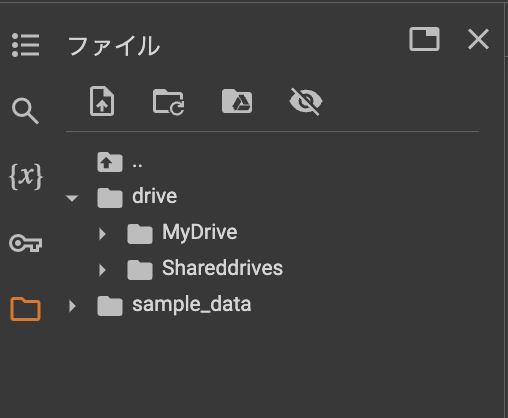

3. 無事マウントが完了すると、左上の画面に画像のように"drive"フォルダが表示されます。この中にあなたのGoogleドライブの中身が入っているはずなので、先ほどアップロードした"credit.csv"を見つけましょう。
4. ファイルの横の3点リーダをクリックすると、「パスをコピー」という項目があるはずです。ここをクリックして、コピーしたパスを使って、いつも通りpd.read_csvでファイルを読み込みましょう。

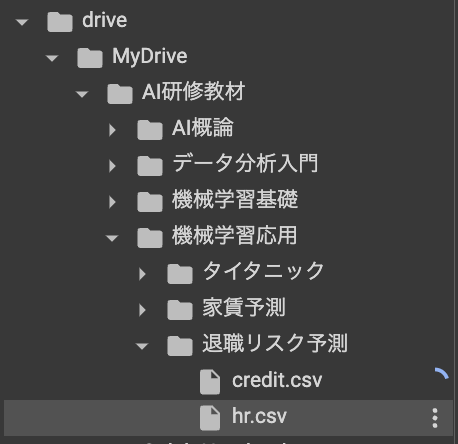

In [ ]:
#pandas(pd)のread_csvメソッドでデータを読み込み
#パスは各自書き換えて下さい
credit = pd.read_csv("/content/drive/MyDrive/AI研修教材/機械学習応用/退職リスク予測/credit.csv")
credit.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


* 機密保持の関係から、v1からv28までのカラムの意味はわからず、また数値も主成分化されたものが入っています
* amountは取引金額、Classは0が正規利用・1が不正利用を指しています

## <font color=#0e89b2>4.2 演習問題1：不正/正規のデータ数の比較</font>

このデータに含まれる、不正利用のデータ数と正規利用のデータ数を比較する棒グラフを描画してください。

In [ ]:
#不正/正規のデータ数の比較


解答

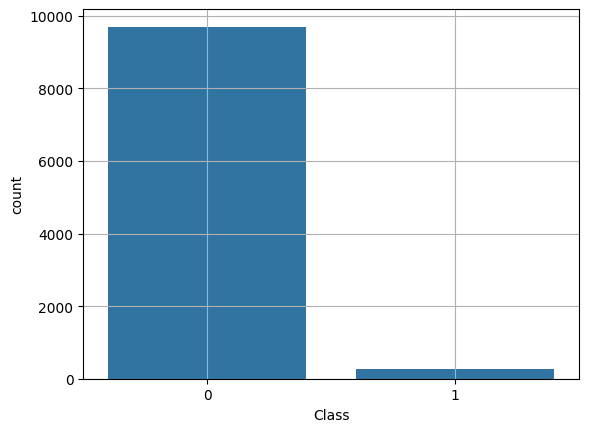

In [ ]:
#不正/正規のデータ数の比較
sns.countplot(x="Class", data=credit)
plt.grid(True)
plt.show()

## <font color=#0e89b2>4.3 演習問題2：LightGBMによるモデルの構築</font>

次に、簡単にLightGBMでモデルを実装してみましょう。<br>
まだOptunaもSMOTEも使いません。<br>
評価指標は、正解率・適合率・再現率の3つを用いて下さい。<br>
さらに今回のケースでは、適合率と再現率は具体的にどのような意味を持つか、テキストメモで解答してください。

In [ ]:
#LightGBMによるモデル構築


解答

In [ ]:
credit.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [ ]:
#説明変数と目的変数をセット
X = credit.drop('Class',axis=1)
Y = credit['Class']

#trainデータとtestデータに分割
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3 ,shuffle=True, random_state=0)

In [ ]:
#モデルの構築と学習
model = lgb.LGBMClassifier()
model.fit(x_train, y_train)

#評価(test)データの推論
pred = model.predict(x_test)

#predは確率値なので0/1の離職フラグに変換
y_pred = np.where(pred < 0.5, 0, 1)

#評価
print("正解率", accuracy_score(y_pred,y_test))
print("適合率", precision_score(y_pred,y_test))
print("再現率", recall_score(y_pred,y_test))

[LightGBM] [Info] Number of positive: 177, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 6968, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.025402 -> initscore=-3.647204
[LightGBM] [Info] Start training from score -3.647204
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
正解率 0.9976565115500502
適合率 0.925
再現率 0.9866666666666667


適合率がやや他の2つよりも低いですが、概ねすでにハイスコアが出ていますね。<br>
このケースでいう適合率と再現率とは、
* 適合率：「不正」と判定したものが実際にどれくらい不正だったかを示す割合
* 再現率：実際に不正な取引をどれくらい不正と判定できたかを示す割合

例えば不正チェックのコストが多大にかかる場合には適合率を重視することになりますし、<br>
1件の不正取引による損害額が大きい場合には再現率を重視することになります。<br>
もちろんこれらの両方を重視することもあります。

## <font color=#0e89b2>4.3 演習問題3：LightGBM×Optuna×SMOTEによるモデルの構築</font>

それでは、本セクションで学んだOptunaとSMOTEを使用して、モデルを構築し直してみましょう。<br>
<br>
◆条件
* SMOTEを使って不均衡データへの対処を行なってください
* Optunaを使ってハイパーパラメータチューニングを行なってください
 * パラメータ数や探索範囲を広げると実行時間がかかります。今回はOptunaを正しく使うことがメインなので、実行時間がかかりすぎない程度にある程度限定して構いません。
* 評価指標は、正解率・適合率・再現率の3つを使ってください


In [ ]:
#SMOTEとOptunaを使ってモデルを再構築


解答

In [ ]:
#SMOTE前のデータ数確認
print("SMOTE前の訓練データ数 {}".format(len(x_train)))
print("SMOTE前の不正利用フラグのデータ数 {}".format(sum(y_train)))

SMOTE前の訓練データ数 6968
SMOTE前の不正利用フラグのデータ数 177


In [ ]:
#SMOTEを使って、訓練(train)データの離職フラグが1を増やす（オーバーサンプリング)
oversampler = SMOTE(random_state=0)
x_train_smoted, y_train_smoted = oversampler.fit_resample(x_train, y_train)

In [ ]:
#SMOTE後のデータ数確認
print("SMOTE後の訓練データ数 {}".format(len(x_train_smoted)))
print("SMOTE後の不正利用フラグのデータ数 {}".format(sum(y_train_smoted)))

SMOTE後の訓練データ数 13582
SMOTE後の不正利用フラグのデータ数 6791


In [ ]:
import optuna

#ハイパーパラメータの自動最適化のための関数
def objective(trial):
    #今回、調整する10種類のハイパーパラメータとその探索範囲
    params = {
        'objective': 'binary',
        'num_leaves': trial.suggest_int('num_leaves', 5, 30),
        'max_depth': trial.suggest_int("max_depth", 3, 20),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 20, 40)
    }

    #訓練(train)データ設定
    lgb_train = lgb.Dataset(x_train_smoted, y_train_smoted)

    #評価(test)データ設定
    lgb_eval = lgb.Dataset(x_test, y_test, reference=lgb_train)

    #LightGBM学習設定
    model = lgb.train(params, lgb_train,
                      valid_sets=[lgb_train, lgb_eval],
                      callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=1),
                               lgb.log_evaluation(10),],
                      num_boost_round=500)

    #評価(test)データの推論
    y_pred_valid = model.predict(x_test, num_iteration=model.best_iteration)

    #スコアとして評価(test)データの正解と推論の差のlog_lossを求める
    score = log_loss(y_test, y_pred_valid)
    return score

In [ ]:
#Optunaによるハイパーパラメータの自動最適化実行
study = optuna.create_study(sampler=optuna.samplers.RandomSampler(seed=0))
study.optimize(objective, n_trials=50)
print("Optuna Best Parameters")
print(study.best_params)

[I 2024-02-01 08:26:01,839] A new study created in memory with name: no-name-8cae8ef5-730c-49d6-b863-427f1e9fe2ac


[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.203392	valid_1's binary_logloss: 0.208384
[20]	training's binary_logloss: 0.0719925	valid_1's binary_logloss: 0.0784584
[30]	training's binary_logloss: 0.027064	valid_1's binary_logloss: 0.0341274
[40]	training's binary_logloss: 0.0104501	valid_1's binary_logloss: 0.0187615
[50]	training's binary_logloss: 0.00403177	valid_1's binary_logloss: 0.0134025
[60]	training's binary_logloss: 0.00155301	valid_1's binary_logloss: 0.01179
[70]	training's binary_logloss: 0.000

[I 2024-02-01 08:26:02,609] Trial 0 finished with value: 0.01093458332359134 and parameters: {'num_leaves': 19, 'max_depth': 15, 'min_data_in_leaf': 32}. Best is trial 0 with value: 0.01093458332359134.


[100]	training's binary_logloss: 3.27941e-05	valid_1's binary_logloss: 0.0115419
[110]	training's binary_logloss: 1.27222e-05	valid_1's binary_logloss: 0.011973
[120]	training's binary_logloss: 5.09504e-06	valid_1's binary_logloss: 0.0117612
[130]	training's binary_logloss: 2.16315e-06	valid_1's binary_logloss: 0.0116158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[89]	training's binary_logloss: 9.48286e-05	valid_1's binary_logloss: 0.0109346
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004410 seconds.
You can set `f

[I 2024-02-01 08:26:03,499] Trial 1 finished with value: 0.010791730762116798 and parameters: {'num_leaves': 19, 'max_depth': 10, 'min_data_in_leaf': 33}. Best is trial 1 with value: 0.010791730762116798.



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[140]	training's binary_logloss: 1.12006e-06	valid_1's binary_logloss: 0.0111926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	training's b

[I 2024-02-01 08:26:04,368] Trial 2 finished with value: 0.008882830939449932 and parameters: {'num_leaves': 16, 'max_depth': 19, 'min_data_in_leaf': 40}. Best is trial 2 with value: 0.008882830939449932.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]	training's binary_logloss: 4.79829e-07	valid_1's binary_logloss: 0.00944419
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-02-01 08:26:05,154] Trial 3 finished with value: 0.009427635916124135 and parameters: {'num_leaves': 14, 'max_depth': 17, 'min_data_in_leaf': 31}. Best is trial 2 with value: 0.008882830939449932.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	training's binary_logloss: 7.4715e-07	valid_1's binary_logloss: 0.0100274
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[105]	training's binary_logloss: 2.59521e-05	valid_1's binary_logloss: 0.00942764
[LightGBM] [Info] Number of positive: 6791, number of

[I 2024-02-01 08:26:05,741] Trial 4 finished with value: 0.012070873158021215 and parameters: {'num_leaves': 19, 'max_depth': 19, 'min_data_in_leaf': 21}. Best is trial 2 with value: 0.008882830939449932.


[70]	training's binary_logloss: 0.00054072	valid_1's binary_logloss: 0.0121265
[80]	training's binary_logloss: 0.000207279	valid_1's binary_logloss: 0.0128978
[90]	training's binary_logloss: 7.8489e-05	valid_1's binary_logloss: 0.0135264
[100]	training's binary_logloss: 3.00119e-05	valid_1's binary_logloss: 0.0144544
[110]	training's binary_logloss: 1.14812e-05	valid_1's binary_logloss: 0.015102
Early stopping, best iteration is:
[61]	training's binary_logloss: 0.00128056	valid_1's binary_logloss: 0.0120709
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for

[I 2024-02-01 08:26:08,627] Trial 5 finished with value: 0.007879892300891408 and parameters: {'num_leaves': 7, 'max_depth': 3, 'min_data_in_leaf': 37}. Best is trial 5 with value: 0.007879892300891408.


Early stopping, best iteration is:
[178]	training's binary_logloss: 0.000111669	valid_1's binary_logloss: 0.00787989
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.203786	valid_1's binary_logloss: 0.208962
[20]	training's binary_logloss: 0.0727865	valid_1's binary_logloss: 0.0794386
[30]	training's binary_logloss: 0.0277358	valid_1's binary_logloss: 0.0349852
[40]	training's binary_logloss: 0.0108908	valid_1's binary_logloss: 0.0190375


[I 2024-02-01 08:26:12,020] Trial 6 finished with value: 0.00954192168978225 and parameters: {'num_leaves': 25, 'max_depth': 18, 'min_data_in_leaf': 40}. Best is trial 5 with value: 0.007879892300891408.


[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.125953 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.20359	valid_1's binary_logloss: 0.208915
[20]	training's binary_logloss: 0.0725877	valid_1's binary_logloss: 0.0794626
[30]	training's binary_logloss: 0.0275599	valid_1's binary_logloss: 0.0351136
[40]	training's binary_logloss: 0.0106622	valid_1's binary_logloss: 0.0191476
[50]	training's binary_logloss: 0.00412769	valid_1's binary_logloss: 0.0136319
[60]	training's binary_logloss: 0.00160

[I 2024-02-01 08:26:15,748] Trial 7 finished with value: 0.010158702232713882 and parameters: {'num_leaves': 25, 'max_depth': 11, 'min_data_in_leaf': 36}. Best is trial 5 with value: 0.007879892300891408.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[85]	training's binary_logloss: 0.000147412	valid_1's binary_logloss: 0.0101587
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.123920 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.209214	valid_1's binary_logloss: 0.214889
[20]	training's binary_logloss: 0.0790295	valid_1's binary_logloss: 0.0904313
[30]	training's binary_logloss: 0.0323893	valid_1's binary_logloss: 0.0424092
[40]	

[I 2024-02-01 08:26:23,567] Trial 8 finished with value: 0.007355386132601489 and parameters: {'num_leaves': 8, 'max_depth': 14, 'min_data_in_leaf': 23}. Best is trial 8 with value: 0.007355386132601489.


Early stopping, best iteration is:
[97]	training's binary_logloss: 0.000252319	valid_1's binary_logloss: 0.00735539
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.203441	valid_1's binary_logloss: 0.208795
[20]	training's binary_logloss: 0.0718474	valid_1's binary_logloss: 0.078303
[30]	training's binary_logloss: 0.0267885	valid_1's binary_logloss: 0.0337739
[40]	training's binary_logloss: 0.0102546	valid_1's binary_logloss: 0.0183767
[5

[I 2024-02-01 08:26:27,412] Trial 9 finished with value: 0.010234499273144166 and parameters: {'num_leaves': 29, 'max_depth': 12, 'min_data_in_leaf': 28}. Best is trial 8 with value: 0.007355386132601489.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[130]	training's binary_logloss: 2.00745e-06	valid_1's binary_logloss: 0.0115967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[84]	training's binary_logloss: 0.000145497	valid_1's binary_logloss: 0.0102345
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.089134 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0

[I 2024-02-01 08:26:39,837] Trial 10 finished with value: 0.008659593505210329 and parameters: {'num_leaves': 11, 'max_depth': 16, 'min_data_in_leaf': 29}. Best is trial 8 with value: 0.007355386132601489.


[140]	training's binary_logloss: 3.07761e-06	valid_1's binary_logloss: 0.00957544
Early stopping, best iteration is:
[92]	training's binary_logloss: 0.00013038	valid_1's binary_logloss: 0.00865959
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.21459	valid_1's binary_logloss: 0.221463
[20]	training's binary_logloss: 0.0841968	valid_1's binary_logloss: 0.0930282
[LightGBM] [W

[I 2024-02-01 08:26:45,217] Trial 11 finished with value: 0.008045532953455387 and parameters: {'num_leaves': 19, 'max_depth': 3, 'min_data_in_leaf': 32}. Best is trial 8 with value: 0.007355386132601489.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[186]	training's binary_logloss: 7.59122e-05	valid_1's binary_logloss: 0.00804553
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.203713	valid_1's binary_logloss: 0.208969
[20]	training's binary_logloss: 0.0726953	valid_1's binary_logloss: 0.0795262
[30]	training's binary_logloss: 0.0277606	valid_1's binary_logloss: 0.0353668
[40]	training's binary_logloss: 0.010943	valid_1's binary_logloss: 0.0193019
[

[I 2024-02-01 08:26:49,787] Trial 12 finished with value: 0.009941134977270207 and parameters: {'num_leaves': 20, 'max_depth': 14, 'min_data_in_leaf': 39}. Best is trial 8 with value: 0.007355386132601489.


Early stopping, best iteration is:
[118]	training's binary_logloss: 7.04163e-06	valid_1's binary_logloss: 0.00994113
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.203583	valid_1's binary_logloss: 0.208658
[20]	training's binary_logloss: 0.071929	valid_1's binary_logloss: 0.078358
[30]	training's binary_logloss: 0.0269349	valid_1's binary_logloss: 0.0337158
[40]	training's binary_logloss: 0.0103361	valid_1's binary_logloss: 0.0184492
[50]	training's binary_logloss: 0.00397421	valid_1's binary_logloss: 0.013476

[I 2024-02-01 08:26:53,154] Trial 13 finished with value: 0.010509085449166768 and parameters: {'num_leaves': 22, 'max_depth': 9, 'min_data_in_leaf': 29}. Best is trial 8 with value: 0.007355386132601489.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[88]	training's binary_logloss: 0.000100193	valid_1's binary_logloss: 0.0105091
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.00000

[I 2024-02-01 08:26:53,783] Trial 14 finished with value: 0.0090209390913956 and parameters: {'num_leaves': 23, 'max_depth': 4, 'min_data_in_leaf': 34}. Best is trial 8 with value: 0.007355386132601489.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[120]	training's binary_logloss: 9.39747e-05	valid_1's binary_logloss: 0.00973998
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-02-01 08:26:54,402] Trial 15 finished with value: 0.011029221763859636 and parameters: {'num_leaves': 22, 'max_depth': 6, 'min_data_in_leaf': 22}. Best is trial 8 with value: 0.007355386132601489.


[100]	training's binary_logloss: 3.99981e-05	valid_1's binary_logloss: 0.0128408
[110]	training's binary_logloss: 1.65662e-05	valid_1's binary_logloss: 0.0123908
Early stopping, best iteration is:
[66]	training's binary_logloss: 0.000894066	valid_1's binary_logloss: 0.0110292
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.204613	valid_1's binary_logloss: 0.210749
[20]	training's binary_logloss: 0.0730852	valid_1's binary_logloss: 0.0800849
[30]	training's binary_logloss: 0.0278586	valid_1's binary_logloss: 0.0

[I 2024-02-01 08:26:55,182] Trial 16 finished with value: 0.009988400750392049 and parameters: {'num_leaves': 13, 'max_depth': 9, 'min_data_in_leaf': 31}. Best is trial 8 with value: 0.007355386132601489.


[130]	training's binary_logloss: 3.49945e-06	valid_1's binary_logloss: 0.0101743
[140]	training's binary_logloss: 1.59177e-06	valid_1's binary_logloss: 0.0101854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	training's binary_logloss: 8.44305e-07	valid_1's binary_logloss: 0.0102147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[I 2024-02-01 08:26:55,801] Trial 17 finished with value: 0.012375739726563624 and parameters: {'num_leaves': 16, 'max_depth': 20, 'min_data_in_leaf': 22}. Best is trial 8 with value: 0.007355386132601489.


[110]	training's binary_logloss: 1.29877e-05	valid_1's binary_logloss: 0.0141959
[120]	training's binary_logloss: 5.13147e-06	valid_1's binary_logloss: 0.0138712
Early stopping, best iteration is:
[75]	training's binary_logloss: 0.000364536	valid_1's binary_logloss: 0.0123757
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.206381	valid_1's binary_logloss: 0.214443
[20]	training's binary_logloss: 0.0768569	valid_1's binary_logloss: 0.0887026
[30]	training's binary_logloss: 0.0297537	valid_1's binary_logloss: 0.0

[I 2024-02-01 08:26:56,405] Trial 18 finished with value: 0.009733741031040482 and parameters: {'num_leaves': 10, 'max_depth': 5, 'min_data_in_leaf': 33}. Best is trial 8 with value: 0.007355386132601489.


[90]	training's binary_logloss: 0.000285389	valid_1's binary_logloss: 0.00990229
[100]	training's binary_logloss: 0.000144397	valid_1's binary_logloss: 0.00985491
[110]	training's binary_logloss: 7.87012e-05	valid_1's binary_logloss: 0.00995385
[120]	training's binary_logloss: 4.21573e-05	valid_1's binary_logloss: 0.0099573
[130]	training's binary_logloss: 2.24624e-05	valid_1's binary_logloss: 0.00990871
[140]	training's binary_logloss: 1.24023e-05	valid_1's binary_logloss: 0.0100871
Early stopping, best iteration is:
[98]	training's binary_logloss: 0.000167695	valid_1's binary_logloss: 0.00973374
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromSc

[I 2024-02-01 08:26:57,089] Trial 19 finished with value: 0.007428197787817645 and parameters: {'num_leaves': 11, 'max_depth': 11, 'min_data_in_leaf': 25}. Best is trial 8 with value: 0.007355386132601489.


[120]	training's binary_logloss: 1.40891e-05	valid_1's binary_logloss: 0.0076115
[130]	training's binary_logloss: 6.56028e-06	valid_1's binary_logloss: 0.00799133
[140]	training's binary_logloss: 3.01877e-06	valid_1's binary_logloss: 0.00850317
[150]	training's binary_logloss: 1.4865e-06	valid_1's binary_logloss: 0.00884647
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]	training's binary_logloss: 7.8488e-07	valid_1's binary_logloss: 0.00929175
Early stopping, best iteration is:
[110]	training's binary_logloss: 3.07815e-05	valid_1's binary_logloss: 0.0074282
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004722 seconds.
You 

[I 2024-02-01 08:26:57,748] Trial 20 finished with value: 0.009109512594149903 and parameters: {'num_leaves': 9, 'max_depth': 4, 'min_data_in_leaf': 33}. Best is trial 8 with value: 0.007355386132601489.


[150]	training's binary_logloss: 3.4346e-05	valid_1's binary_logloss: 0.00960376
[160]	training's binary_logloss: 2.14889e-05	valid_1's binary_logloss: 0.00978274
[170]	training's binary_logloss: 1.40306e-05	valid_1's binary_logloss: 0.00988566
[180]	training's binary_logloss: 9.08746e-06	valid_1's binary_logloss: 0.0102651
Early stopping, best iteration is:
[132]	training's binary_logloss: 8.25646e-05	valid_1's binary_logloss: 0.00910951
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005885 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.209366	valid_1's binary_l

[I 2024-02-01 08:26:58,344] Trial 21 finished with value: 0.007468159649139995 and parameters: {'num_leaves': 8, 'max_depth': 6, 'min_data_in_leaf': 27}. Best is trial 8 with value: 0.007355386132601489.


[140]	training's binary_logloss: 2.09786e-05	valid_1's binary_logloss: 0.0080137
Early stopping, best iteration is:
[98]	training's binary_logloss: 0.000239444	valid_1's binary_logloss: 0.00746816
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002939 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[I 2024-02-01 08:26:59,048] Trial 22 finished with value: 0.00861459783728436 and parameters: {'num_leaves': 26, 'max_depth': 4, 'min_data_in_leaf': 37}. Best is trial 8 with value: 0.007355386132601489.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[130]	training's binary_logloss: 6.17312e-05	valid_1's binary_logloss: 0.00927707
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-02-01 08:26:59,661] Trial 23 finished with value: 0.007020293760139551 and parameters: {'num_leaves': 7, 'max_depth': 20, 'min_data_in_leaf': 29}. Best is trial 23 with value: 0.007020293760139551.



[150]	training's binary_logloss: 2.82335e-05	valid_1's binary_logloss: 0.00730251
[160]	training's binary_logloss: 1.78395e-05	valid_1's binary_logloss: 0.00731396
Early stopping, best iteration is:
[114]	training's binary_logloss: 0.000170074	valid_1's binary_logloss: 0.00702029
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.203541	valid_1's binary_logloss: 0.208778
[20]	training's binary_logloss: 0.0725254	valid_1's binary_logloss: 0

[I 2024-02-01 08:27:00,478] Trial 24 finished with value: 0.010223357133505818 and parameters: {'num_leaves': 30, 'max_depth': 13, 'min_data_in_leaf': 35}. Best is trial 23 with value: 0.007020293760139551.


[100]	training's binary_logloss: 3.50892e-05	valid_1's binary_logloss: 0.0109119
[110]	training's binary_logloss: 1.34814e-05	valid_1's binary_logloss: 0.0110426
[120]	training's binary_logloss: 5.32083e-06	valid_1's binary_logloss: 0.0106771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[130]	training's binary_logloss: 2.29759e-06	valid_1's binary_logloss: 0.0104561
Early stopping, best iteration is:
[80]	training's binary_logloss: 0.000237426	valid_1's binary_logloss: 0.0102234
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500

[I 2024-02-01 08:27:02,212] Trial 25 finished with value: 0.006754654477369375 and parameters: {'num_leaves': 6, 'max_depth': 8, 'min_data_in_leaf': 22}. Best is trial 25 with value: 0.006754654477369375.


[170]	training's binary_logloss: 4.13568e-05	valid_1's binary_logloss: 0.00739399
Early stopping, best iteration is:
[129]	training's binary_logloss: 0.000201851	valid_1's binary_logloss: 0.00675465
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.106725 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.205325	valid_1's binary_logloss: 0.212342
[20]	training's binary_logloss: 0.0738524	valid_1's binary_logloss: 0.0819234
[30]	training's binary_logloss: 0.028555	valid_1's binary_logloss: 0.0367734
[40]	training's binary_logloss: 0.0115027	valid_1's binary_logloss: 0.01

[I 2024-02-01 08:27:04,196] Trial 26 finished with value: 0.009513355680066992 and parameters: {'num_leaves': 12, 'max_depth': 5, 'min_data_in_leaf': 26}. Best is trial 25 with value: 0.006754654477369375.


[100]	training's binary_logloss: 9.62546e-05	valid_1's binary_logloss: 0.00961056
[110]	training's binary_logloss: 4.53601e-05	valid_1's binary_logloss: 0.0100029
[120]	training's binary_logloss: 2.24648e-05	valid_1's binary_logloss: 0.010197
[130]	training's binary_logloss: 1.14429e-05	valid_1's binary_logloss: 0.0101738
[140]	training's binary_logloss: 5.68699e-06	valid_1's binary_logloss: 0.0104131
Early stopping, best iteration is:
[96]	training's binary_logloss: 0.000129238	valid_1's binary_logloss: 0.00951336
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits wit

[I 2024-02-01 08:27:04,854] Trial 27 finished with value: 0.009020948824493863 and parameters: {'num_leaves': 15, 'max_depth': 4, 'min_data_in_leaf': 34}. Best is trial 25 with value: 0.006754654477369375.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[120]	training's binary_logloss: 9.39747e-05	valid_1's binary_logloss: 0.00973999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[I 2024-02-01 08:27:05,514] Trial 28 finished with value: 0.010360696200522167 and parameters: {'num_leaves': 19, 'max_depth': 7, 'min_data_in_leaf': 30}. Best is trial 25 with value: 0.006754654477369375.


[100]	training's binary_logloss: 3.5692e-05	valid_1's binary_logloss: 0.0109062
[110]	training's binary_logloss: 1.40158e-05	valid_1's binary_logloss: 0.0109873
[120]	training's binary_logloss: 5.6669e-06	valid_1's binary_logloss: 0.011482
[130]	training's binary_logloss: 2.43116e-06	valid_1's binary_logloss: 0.0115958
Early stopping, best iteration is:
[81]	training's binary_logloss: 0.000208911	valid_1's binary_logloss: 0.0103607
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.210967	valid_1's binary_logloss:

[I 2024-02-01 08:27:06,075] Trial 29 finished with value: 0.006386077345833814 and parameters: {'num_leaves': 7, 'max_depth': 13, 'min_data_in_leaf': 39}. Best is trial 29 with value: 0.006386077345833814.


[140]	training's binary_logloss: 5.14294e-05	valid_1's binary_logloss: 0.00734289
Early stopping, best iteration is:
[98]	training's binary_logloss: 0.000404415	valid_1's binary_logloss: 0.00638608
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.204272	valid_1's binary_logloss: 0.211207
[20]	training's binary_logloss: 0.0723133	valid_1's binary_logloss: 0.0792938
[30]	training's binary_logloss: 0.0274628	valid_1's binary_logloss: 0.0350531
[40]	training's binary_logloss: 0.0110344	valid_1's binary_logloss: 0.01

[I 2024-02-01 08:27:06,900] Trial 30 finished with value: 0.01083121598816828 and parameters: {'num_leaves': 13, 'max_depth': 15, 'min_data_in_leaf': 22}. Best is trial 29 with value: 0.006386077345833814.


[140]	training's binary_logloss: 1.46463e-06	valid_1's binary_logloss: 0.0108794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	training's binary_logloss: 7.75624e-07	valid_1's binary_logloss: 0.0109659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[I 2024-02-01 08:27:07,560] Trial 31 finished with value: 0.012144123588576564 and parameters: {'num_leaves': 23, 'max_depth': 8, 'min_data_in_leaf': 23}. Best is trial 29 with value: 0.006386077345833814.


[100]	training's binary_logloss: 3.01415e-05	valid_1's binary_logloss: 0.0128333
[110]	training's binary_logloss: 1.15479e-05	valid_1's binary_logloss: 0.013092
[120]	training's binary_logloss: 4.56326e-06	valid_1's binary_logloss: 0.0135865
Early stopping, best iteration is:
[70]	training's binary_logloss: 0.000547884	valid_1's binary_logloss: 0.0121441
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004649 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: 

[I 2024-02-01 08:27:08,245] Trial 32 finished with value: 0.008632501216595978 and parameters: {'num_leaves': 20, 'max_depth': 3, 'min_data_in_leaf': 37}. Best is trial 29 with value: 0.006386077345833814.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]	training's binary_logloss: 0.000179404	valid_1's binary_logloss: 0.00882319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	training's binary_logloss: 0.000133714	valid_1's binary_logloss: 0.00887258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[180]	training's binary_logloss: 9.83929e-05	valid_1's binary_logloss: 0.00886734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[190]	training's binary_logloss: 7.23291e-05	valid_1's binary_logloss: 0.00888728
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2024-02-01 08:27:08,952] Trial 33 finished with value: 0.007597145596793851 and parameters: {'num_leaves': 5, 'max_depth': 15, 'min_data_in_leaf': 25}. Best is trial 29 with value: 0.006386077345833814.


[150]	training's binary_logloss: 0.000294331	valid_1's binary_logloss: 0.00768494
[160]	training's binary_logloss: 0.000221936	valid_1's binary_logloss: 0.00776224
[170]	training's binary_logloss: 0.00016578	valid_1's binary_logloss: 0.00759715
[180]	training's binary_logloss: 0.000127238	valid_1's binary_logloss: 0.00771752
[190]	training's binary_logloss: 9.38405e-05	valid_1's binary_logloss: 0.00779309
[200]	training's binary_logloss: 7.19257e-05	valid_1's binary_logloss: 0.00775299
[210]	training's binary_logloss: 5.44e-05	valid_1's binary_logloss: 0.00784816
[220]	training's binary_logloss: 4.179e-05	valid_1's binary_logloss: 0.0081094
Early stopping, best iteration is:
[170]	training's binary_logloss: 0.00016578	valid_1's binary_logloss: 0.00759715
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[Lig

[I 2024-02-01 08:27:09,577] Trial 34 finished with value: 0.012110162588200702 and parameters: {'num_leaves': 24, 'max_depth': 20, 'min_data_in_leaf': 25}. Best is trial 29 with value: 0.006386077345833814.


[100]	training's binary_logloss: 3.06779e-05	valid_1's binary_logloss: 0.0127292
Early stopping, best iteration is:
[59]	training's binary_logloss: 0.0016172	valid_1's binary_logloss: 0.0121102
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003827 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.203392	valid_1's binary_logloss: 0.208384
[20]	training's binary_logloss: 0.0719925	valid_1's binary_logloss: 0.0784584
[30]	training's binary_logloss: 0.027064	valid_1's binary_logloss: 0.0341274
[40]	training

[I 2024-02-01 08:27:10,291] Trial 35 finished with value: 0.01093458332359134 and parameters: {'num_leaves': 19, 'max_depth': 13, 'min_data_in_leaf': 32}. Best is trial 29 with value: 0.006386077345833814.


[130]	training's binary_logloss: 2.16315e-06	valid_1's binary_logloss: 0.0116158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[89]	training's binary_logloss: 9.48286e-05	valid_1's binary_logloss: 0.0109346
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004331 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0

[I 2024-02-01 08:27:10,915] Trial 36 finished with value: 0.008503262650206653 and parameters: {'num_leaves': 10, 'max_depth': 20, 'min_data_in_leaf': 29}. Best is trial 29 with value: 0.006386077345833814.


Early stopping, best iteration is:
[94]	training's binary_logloss: 0.000143549	valid_1's binary_logloss: 0.00850326
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.202502	valid_1's binary_logloss: 0.207435
[20]	training's binary_logloss: 0.0712675	valid_1's binary_logloss: 0.0778767
[30]	training's binary_logloss: 0.0264556	valid_1's binary_logloss: 0.0337543
[40]	training's binary_logloss: 0.0100603	valid_1's binary_logloss: 0.0185747
[50]	training's binary_logloss: 0.00384601	valid_1's binary_logloss: 0.01357

[I 2024-02-01 08:27:11,619] Trial 37 finished with value: 0.01214643439145087 and parameters: {'num_leaves': 27, 'max_depth': 15, 'min_data_in_leaf': 26}. Best is trial 29 with value: 0.006386077345833814.


[110]	training's binary_logloss: 1.18497e-05	valid_1's binary_logloss: 0.0135232
Early stopping, best iteration is:
[62]	training's binary_logloss: 0.00121794	valid_1's binary_logloss: 0.0121464
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.203756	valid_1's binary_logloss: 0.209042
[20]	training's binary_logloss: 0.0728222	valid_1's binary_logloss: 0.079655
[30]	training's binary_logloss: 0.0276683	valid_1's binary_logloss: 0.0349168
[

[I 2024-02-01 08:27:12,676] Trial 38 finished with value: 0.009015499669896567 and parameters: {'num_leaves': 26, 'max_depth': 10, 'min_data_in_leaf': 38}. Best is trial 29 with value: 0.006386077345833814.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]	training's binary_logloss: 4.61878e-07	valid_1's binary_logloss: 0.0095945
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[I 2024-02-01 08:27:13,565] Trial 39 finished with value: 0.010885296975218051 and parameters: {'num_leaves': 20, 'max_depth': 18, 'min_data_in_leaf': 34}. Best is trial 29 with value: 0.006386077345833814.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	training's binary_logloss: 6.44386e-07	valid_1's binary_logloss: 0.0112276
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]	training's binary_logloss: 4.49482e-07	valid_1's binary_logloss: 0.0111501
[LightGBM] [W

[I 2024-02-01 08:27:15,441] Trial 40 finished with value: 0.008616062558084215 and parameters: {'num_leaves': 23, 'max_depth': 12, 'min_data_in_leaf': 40}. Best is trial 29 with value: 0.006386077345833814.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	training's binary_logloss: 3.78498e-07	valid_1's binary_logloss: 0.00911884
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[128]	training's binary_logloss: 2.95483e-06	valid_1's bin

[I 2024-02-01 08:27:19,064] Trial 41 finished with value: 0.011140346738776837 and parameters: {'num_leaves': 21, 'max_depth': 10, 'min_data_in_leaf': 32}. Best is trial 29 with value: 0.006386077345833814.


[120]	training's binary_logloss: 5.08196e-06	valid_1's binary_logloss: 0.0117467
[130]	training's binary_logloss: 2.1703e-06	valid_1's binary_logloss: 0.0114339
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[140]	training's binary_logloss: 1.06283e-06	valid_1's binary_logloss: 0.0115744
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

[I 2024-02-01 08:27:19,698] Trial 42 finished with value: 0.007792468153115061 and parameters: {'num_leaves': 5, 'max_depth': 8, 'min_data_in_leaf': 33}. Best is trial 29 with value: 0.006386077345833814.


[170]	training's binary_logloss: 0.000160346	valid_1's binary_logloss: 0.00818275
[180]	training's binary_logloss: 0.000120097	valid_1's binary_logloss: 0.00813145
[190]	training's binary_logloss: 8.99219e-05	valid_1's binary_logloss: 0.00803449
Early stopping, best iteration is:
[146]	training's binary_logloss: 0.000324875	valid_1's binary_logloss: 0.00779247
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.204924	valid_1's binary_logloss: 0.211862
[20]	training's binary_logloss: 0.0734114	valid_1's binary_logl

[I 2024-02-01 08:27:20,429] Trial 43 finished with value: 0.009127280463460308 and parameters: {'num_leaves': 12, 'max_depth': 14, 'min_data_in_leaf': 29}. Best is trial 29 with value: 0.006386077345833814.


[130]	training's binary_logloss: 4.39021e-06	valid_1's binary_logloss: 0.00986084
[140]	training's binary_logloss: 2.02394e-06	valid_1's binary_logloss: 0.00988616
[150]	training's binary_logloss: 1.03185e-06	valid_1's binary_logloss: 0.0101818
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]

[I 2024-02-01 08:27:21,077] Trial 44 finished with value: 0.007946459973511753 and parameters: {'num_leaves': 8, 'max_depth': 8, 'min_data_in_leaf': 31}. Best is trial 29 with value: 0.006386077345833814.


[130]	training's binary_logloss: 3.613e-05	valid_1's binary_logloss: 0.00841991
[140]	training's binary_logloss: 2.03544e-05	valid_1's binary_logloss: 0.00841659
[150]	training's binary_logloss: 1.1909e-05	valid_1's binary_logloss: 0.0084942
[160]	training's binary_logloss: 6.92118e-06	valid_1's binary_logloss: 0.00844632
Early stopping, best iteration is:
[110]	training's binary_logloss: 0.00011471	valid_1's binary_logloss: 0.00794646
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.203459	valid_1's binary_logl

[I 2024-02-01 08:27:21,757] Trial 45 finished with value: 0.011171427396320259 and parameters: {'num_leaves': 20, 'max_depth': 13, 'min_data_in_leaf': 33}. Best is trial 29 with value: 0.006386077345833814.



[120]	training's binary_logloss: 5.22815e-06	valid_1's binary_logloss: 0.0122667
[130]	training's binary_logloss: 2.26166e-06	valid_1's binary_logloss: 0.0124061
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[86]	training's binary_logloss: 0.000128279	valid_1's binary_logloss: 0.0111714
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.20377	valid_1's binary_logloss: 0.208976

[I 2024-02-01 08:27:22,475] Trial 46 finished with value: 0.009615269703181365 and parameters: {'num_leaves': 21, 'max_depth': 10, 'min_data_in_leaf': 38}. Best is trial 29 with value: 0.006386077345833814.


[100]	training's binary_logloss: 3.55323e-05	valid_1's binary_logloss: 0.00986328
[110]	training's binary_logloss: 1.4042e-05	valid_1's binary_logloss: 0.0102417
[120]	training's binary_logloss: 5.6612e-06	valid_1's binary_logloss: 0.0102771
Early stopping, best iteration is:
[79]	training's binary_logloss: 0.000258425	valid_1's binary_logloss: 0.00961527
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.204405	valid_1's binary_logloss: 0.210315
[20]	training's binary_logloss: 0.0730474	valid_1's binary_logloss: 

[I 2024-02-01 08:27:23,215] Trial 47 finished with value: 0.00988865307395343 and parameters: {'num_leaves': 14, 'max_depth': 10, 'min_data_in_leaf': 38}. Best is trial 29 with value: 0.006386077345833814.


[120]	training's binary_logloss: 7.31526e-06	valid_1's binary_logloss: 0.0100079
[130]	training's binary_logloss: 3.05755e-06	valid_1's binary_logloss: 0.0103206
[140]	training's binary_logloss: 1.41472e-06	valid_1's binary_logloss: 0.0103313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	training's binary_logloss: 7.81404e-07	valid_1's binary_logloss: 0.0106781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[I 2024-02-01 08:27:23,856] Trial 48 finished with value: 0.013091863346144695 and parameters: {'num_leaves': 25, 'max_depth': 15, 'min_data_in_leaf': 22}. Best is trial 29 with value: 0.006386077345833814.


[100]	training's binary_logloss: 2.91934e-05	valid_1's binary_logloss: 0.0145062
Early stopping, best iteration is:
[59]	training's binary_logloss: 0.00153124	valid_1's binary_logloss: 0.0130919
[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.20378	valid_1's binary_logloss: 0.208961
[20]	training's binary_logloss: 0.072779	valid_1's binary_logloss: 0.0794426
[30]	training's binary_logloss: 0.0277136	valid_1's binary_logloss: 0.0350909
[4

[I 2024-02-01 08:27:24,860] Trial 49 finished with value: 0.009235310244051336 and parameters: {'num_leaves': 28, 'max_depth': 15, 'min_data_in_leaf': 40}. Best is trial 29 with value: 0.006386077345833814.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]	training's binary_logloss: 4.78655e-07	valid_1's binary_logloss: 0.00950846
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	training's b

In [ ]:
#Optunaで求めたハイパーパラメータ(Optunaのログの最後)
params = {"objective":"binary",
           'num_leaves': 7,
           'max_depth': 13,
           'min_data_in_leaf': 39
          }

#LightGBM訓練(train)データ設定
lgb_train = lgb.Dataset(x_train_smoted, y_train_smoted)

#LightGBM評価(test)データ設定
lgb_eval = lgb.Dataset(x_test, y_test, reference=lgb_train)

#LightGBM学習設定
model_v2 = lgb.train(params, lgb_train,
                valid_sets=[lgb_train, lgb_eval],
                callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=1),
                lgb.log_evaluation(10),],
                num_boost_round=2000)

#評価(test)データの推論
pred_v2 = model_v2.predict(x_test)

[LightGBM] [Info] Number of positive: 6791, number of negative: 6791
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.107020 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7650
[LightGBM] [Info] Number of data points in the train set: 13582, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training until validation scores don't improve for 50 rounds
[10]	training's binary_logloss: 0.210967	valid_1's binary_logloss: 0.217064
[20]	training's binary_logloss: 0.0816202	valid_1's binary_logloss: 0.092468
[30]	training's binary_logloss: 0.0350968	valid_1's binary_logloss: 0.0472239
[40]	training's binary_logloss: 0.0153946	valid_1's binary_logloss: 0.024485
[50]	training's binary_logloss: 0.00755442	valid_1's binary_logloss: 0.0154911
[60]	training's binary_logloss: 0.00392468	valid_1's binary_logloss: 0.0105465
[70]	training's binary_logloss: 0.00

In [ ]:
#predは確率値なので0/1の離職フラグに変換
y_pred_v2 = np.where(pred_v2 < 0.5, 0, 1)

#評価
print("正解率", accuracy_score(y_pred_v2, y_test))
print("適合率", precision_score(y_pred_v2, y_test))
print("再現率", recall_score(y_pred_v2, y_test))

正解率 0.9986608637428859
適合率 0.9625
再現率 0.9871794871794872


結果を比較してみます。

| モデル | 正解率 | 適合率 | 再現率 |
|    ---   |    ---     |  ---  | ---  |
| Before | 99.7% | 92.5% | 98.7% |
| After | 99.9% | 96.2% | 98.7%|

上手くモデルの精度を向上することができましたね。